/opt/lsst/software/stack/conda/envs/lsst-scipipe-13.0.0-exact/lib/python3.13/site-packages/danish/loss.py:54: RuntimeWarning: invalid value encountered in sqrt
  return (data - model) / np.sqrt(var + model + (alpha * model)**2)


success=True  cost=1.236e+07  nfev=42  fwhm=0.628


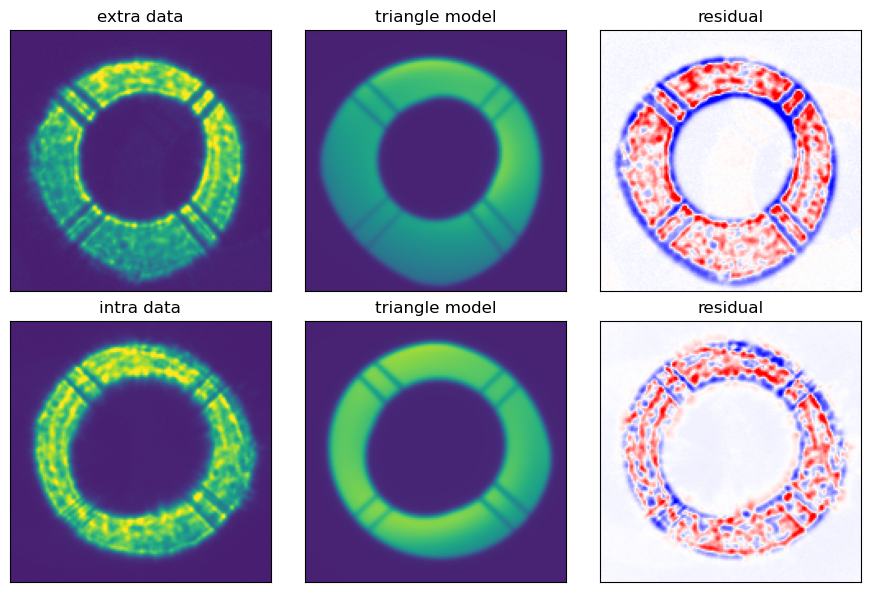

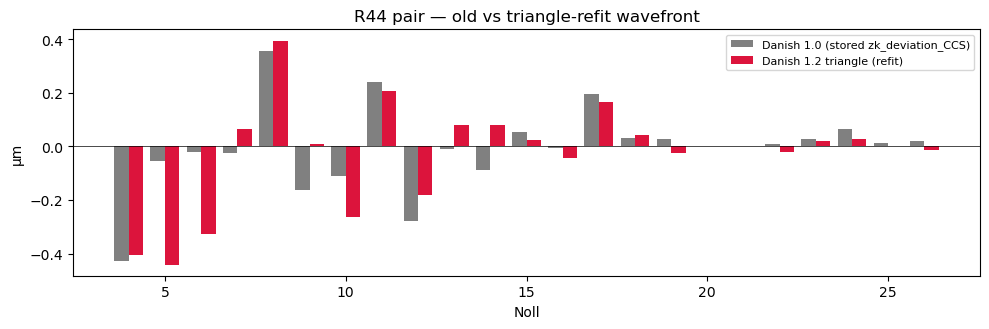

In [2]:
import numpy as np, danish, matplotlib.pyplot as plt
from scipy.optimize import least_squares
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument


from lsst.daf.butler import Butler
butler = Butler('/repo/main',
                collections='LSSTCam/runs/aos/cwfs/danish_1_0/wep_17_3_0/dv_4_2_0/bin_x2')

binning = 1
inst = getTaskInstrument("LSSTCam", "R00_SW0", None)
algo = DanishAlgorithm()

# --- same R44 pair (det 203, first used pair) ---
DAY, SEQ, DET = 20260315, 231, 203
es  = butler.get('donutStampsExtra', day_obs=DAY, seq_num=SEQ, detector=DET)
is_ = butler.get('donutStampsIntra', day_obs=DAY, seq_num=SEQ, detector=DET)
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY, seq_num=SEQ)
noll = [int(x) for x in agg.meta['nollIndices']]
i0 = np.where((np.asarray(agg['detector']).astype(str)=='R44_SW0') & np.asarray(agg['used']))[0][0]
row = agg[i0]
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])
extra_stamp = es[int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))]
intra_stamp = is_[int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))]

# --- triangle factory (Danish 1.2), binning=1 ---
md = es.metadata
rtp_deg = np.rad2deg(md["BORESIGHT_PAR_ANGLE_RAD"] - md["BORESIGHT_ROT_ANGLE_RAD"] - np.pi/2)
factory = danish.DonutTriangleFactory(
    R_outer=inst.radius, R_inner=inst.radius*inst.obscuration,
    mask_params=inst.maskParams, focal_length=inst.focalLength,
    pixel_scale=inst.pixelSize*binning,
    spider_angle=rtp_deg)          # proven (deg) for DonutFactory; if model looks rotated, try np.deg2rad(rtp_deg)

# --- prep both donuts; reference = intrinsic ---
zk_int = np.asarray(row['zk_intrinsic_CCS'])*1e-6           # meters
ie, ae, ze, bge = algo._prepDanish(image=extra_stamp.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
ii, ai, zi, bgi = algo._prepDanish(image=intra_stamp.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
imgs, skyLevels, zkRefs = [ie, ii], [bge, bgi], [ze, zi]    # order: [extra, intra]
thxs, thys = [ae[0], ai[0]], [ae[1], ai[1]]
dz_terms = [(1, j) for j in noll]

BKG_ORDER = 2                                              # danish background poly order (drop to 0/1 if it absorbs signal)
model = danish.DZMultiDonutModel(factory, z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys,
            npix=ie.shape[0], bkg_order=BKG_ORDER)

x0 = model.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs],
                       dxs=[0.,0.], dys=[0.,0.], fwhm=1.0,
                       bkgs=[[0.]*model.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
bnds = model.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2,
                         fwhm=[0.1,5.0], bkgs=[[[-np.inf,np.inf]]*model.nbkg]*2,
                         wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
bnds = [list(b) for b in zip(*bnds)]
x0 = np.clip(x0, bnds[0], bnds[1])

result = least_squares(model.chi, jac=model.jac, x0=x0, args=(imgs, skyLevels), bounds=bnds)
p = model.unpack_params(result.x)
zkFit = np.asarray(p['wavefront_params'])
zk_new_um = (zkFit + zk_int)*1e6        # triangle-refit wavefront (off-axis-relative), microns  ~ comparable to zk_deviation_CCS
print(f"success={result.success}  cost={result.cost:.3e}  nfev={result.nfev}  fwhm={p['fwhm']:.3f}")

model_imgs = model.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], zkFit, bkgs=p['bkgs'])  # [extra, intra]

# --- data | model | residual (unit-sum normalized) ---
def nrm(a): s=np.sum(a); return a/s if s>0 else a
fig, ax = plt.subplots(2, 3, figsize=(9, 6))
for r,(d,m) in enumerate([(nrm(imgs[0]),nrm(model_imgs[0])),(nrm(imgs[1]),nrm(model_imgs[1]))]):
    vmax = float(np.nanquantile(d, 0.99))
    ax[r,0].imshow(d, origin='lower', vmin=-vmax/10, vmax=vmax); ax[r,0].set_title(f"{['extra','intra'][r]} data")
    ax[r,1].imshow(m, origin='lower', vmin=-vmax/10, vmax=vmax); ax[r,1].set_title("triangle model")
    ax[r,2].imshow(d-m, origin='lower', cmap='bwr', vmin=-vmax/3, vmax=vmax/3); ax[r,2].set_title("residual")
for a in ax.ravel(): a.set_xticks([]); a.set_yticks([])
plt.tight_layout(); plt.show()

# --- old (Danish 1.0) vs new (1.2 triangle) Zernikes ---
old = np.asarray(row['zk_deviation_CCS'], float)
fig2, axb = plt.subplots(figsize=(10, 3.4))
axb.bar(np.array(noll)-0.2, old,       width=0.4, color='gray',    label='Danish 1.0 (stored zk_deviation_CCS)')
axb.bar(np.array(noll)+0.2, zk_new_um, width=0.4, color='crimson', label='Danish 1.2 triangle (refit)')
axb.axhline(0, color='k', lw=0.5); axb.set_xlabel('Noll'); axb.set_ylabel('μm'); axb.legend(fontsize=8)
axb.set_title('R44 pair — old vs triangle-refit wavefront'); plt.tight_layout(); plt.show()

extra:  sum|resid| round=0.3138   triangle=0.2911
intra:  sum|resid| round=0.2051   triangle=0.1976


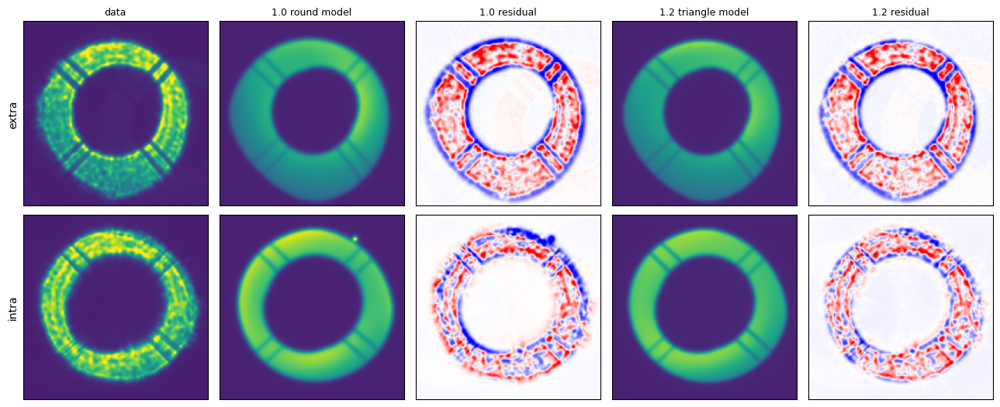

In [3]:
# --- round-factory model from the STORED (Danish 1.0) fit, for comparison ---
ei = agg.meta['estimatorInfo']
KEYS = ['fit_success','fwhm','model_bkg','model_dx','model_dy','model_flux']
meta_old = {k: np.asarray(ei[k])[i0] for k in KEYS}

factory_round = danish.DonutFactory(
    R_outer=inst.radius, R_inner=inst.radius*inst.obscuration,
    mask_params=inst.maskParams, focal_length=inst.focalLength,
    pixel_scale=inst.pixelSize*binning, spider_angle=rtp_deg)

nbkg = np.asarray(meta_old['model_bkg']).shape[1]
bkg_order_old = int(np.sqrt(9 + 8*(nbkg - 1)) - 3)//2          # -1 (0 terms) for the stored fit
model_round = danish.DZMultiDonutModel(
    factory_round, z_refs=zkRefs, dz_terms=dz_terms, field_radius=np.deg2rad(1.81),
    thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=bkg_order_old)
zk_fit_old = (np.asarray(row['zk_deviation_CCS']) - np.asarray(row['zk_intrinsic_CCS']))*1e-6
round_imgs = model_round.model(meta_old['model_flux'], meta_old['model_dx'],
                               meta_old['model_dy'], meta_old['fwhm'], zk_fit_old,
                               bkgs=[tuple(b) for b in meta_old['model_bkg']])   # [extra, intra]

# --- side-by-side: data | round model | round resid | triangle model | triangle resid ---
def nrm(a): s = np.sum(a); return a/s if s > 0 else a
cols = ['data', '1.0 round model', '1.0 residual', '1.2 triangle model', '1.2 residual']
fig, ax = plt.subplots(2, 5, figsize=(13, 5.4))
for r in range(2):                                   # 0=extra, 1=intra
    d  = nrm(imgs[r]); rm = nrm(round_imgs[r]); tm = nrm(model_imgs[r])
    vmax = float(np.nanquantile(d, 0.99))
    panels = [(d, 'd'), (rm, 'd'), (d-rm, 'r'), (tm, 'd'), (d-tm, 'r')]
    for c, (img, kind) in enumerate(panels):
        if kind == 'd':
            ax[r, c].imshow(img, origin='lower', vmin=-vmax/10, vmax=vmax)
        else:
            ax[r, c].imshow(img, origin='lower', cmap='bwr', vmin=-vmax/3, vmax=vmax/3)
        ax[r, c].set_xticks([]); ax[r, c].set_yticks([])
        if r == 0: ax[r, c].set_title(cols[c], fontsize=9)
    ax[r, 0].set_ylabel(['extra','intra'][r], fontsize=10)
    print(f"{['extra','intra'][r]}:  sum|resid| round={np.sum(np.abs(d-rm)):.4f}   "
          f"triangle={np.sum(np.abs(d-tm)):.4f}")
plt.tight_layout(); plt.show()

In [4]:
i4 = noll.index(4)
print("Z4 (Noll 4) intrinsic reference used by danish, microns:\n")
for lbl, stamp, zkref in [('extra/SW0', extra_stamp, ze), ('intra/SW1', intra_stamp, zi)]:
    wi = stamp.wep_im
    print(f"  {lbl}: det={stamp.detector_name}  defocal={wi.defocalType}  "
          f"field=({np.rad2deg(wi.fieldAngle[0]):+.3f}, {np.rad2deg(wi.fieldAngle[1]):+.3f}) deg")
    print(f"      danish reference  zkRef[Z4] = {zkref[4]*1e6:+.4f}")
    try:
        oa = inst.getOffAxisCoeff(wi.fieldAngle[0], wi.fieldAngle[1], wi.defocalType, wi.bandLabel,
                                  nollIndicesModel=np.arange(0, 79), nollIndicesIntr=noll)
        print(f"               = offAxisCoeff[Z4] {oa[4]*1e6:+.4f}  +  zkStart(zk_intrinsic_CCS)[Z4] {zk_int[i4]*1e6:+.4f}")
    except Exception as e:
        print(f"               (offAxis breakdown unavailable: {type(e).__name__}: {e})")
print(f"\n  table zk_intrinsic_CCS[Z4] (ONE value for the pair) = {np.asarray(row['zk_intrinsic_CCS'])[i4]:+.4f} um")

Z4 (Noll 4) intrinsic reference used by danish, microns:

  extra/SW0: det=R44_SW0  defocal=DefocalType.Extra  field=(+66.594, +64.626) deg
      danish reference  zkRef[Z4] = +23.9004
               = offAxisCoeff[Z4] +23.9161  +  zkStart(zk_intrinsic_CCS)[Z4] -0.0157
  intra/SW1: det=R44_SW1  defocal=DefocalType.Intra  field=(+73.069, +65.737) deg
      danish reference  zkRef[Z4] = -23.9675
               = offAxisCoeff[Z4] -23.9518  +  zkStart(zk_intrinsic_CCS)[Z4] -0.0157

  table zk_intrinsic_CCS[Z4] (ONE value for the pair) = -0.0157 um


In [5]:
print("batoidModelName:", inst.batoidModelName)

batoidModelName: LSST_{band}


In [6]:
import os, sys, pandas as pd
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code'))   # ccd_height module
import ccd_height as cch
from lsst.obs.lsst import LsstCam
camera = LsstCam.getCamera()
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')            # holds ccd_height_map

def height_z4(det_name, cx, cy):                       # per-CCD Z4 (um) at one donut centroid
    df = pd.DataFrame({'detector':[det_name],
                       'centroid_x_intra':[cx], 'centroid_y_intra':[cy],
                       'centroid_x_extra':[cx], 'centroid_y_extra':[cy]})
    return float(cch.compute_ccd_heights(df, camera, source='batoid_rubin',
                                         height_map_dir=HMAP)['Z4_height'][0])

raft = str(row['detector'])[:3]                        # 'R44'
z4_extra = height_z4(f'{raft}_SW0', row['centroid_x_extra'], row['centroid_y_extra'])
z4_intra = height_z4(f'{raft}_SW1', row['centroid_x_intra'], row['centroid_y_intra'])
print(f"CCD-height Z4:  extra/SW0={z4_extra:+.4f}  intra/SW1={z4_intra:+.4f} um")

i4 = noll.index(4)
zkStart_extra = zk_int.copy(); zkStart_extra[i4] += z4_extra*1e-6   # meters
zkStart_intra = zk_int.copy(); zkStart_intra[i4] += z4_intra*1e-6

# re-prep with per-donut zkStart (now intra/extra references differ by the real piston), then refit
ie, ae, ze, bge = algo._prepDanish(image=extra_stamp.wep_im, zkStart=zkStart_extra, nollIndices=noll, instrument=inst)
ii, ai, zi, bgi = algo._prepDanish(image=intra_stamp.wep_im, zkStart=zkStart_intra, nollIndices=noll, instrument=inst)
imgs, skyLevels, zkRefs = [ie, ii], [bge, bgi], [ze, zi]
thxs, thys = [ae[0], ai[0]], [ae[1], ai[1]]
print(f"reference zkRef[Z4]:  extra={ze[4]*1e6:+.4f}  intra={zi[4]*1e6:+.4f} um  (now differ by the height piston)")

model = danish.DZMultiDonutModel(factory, z_refs=zkRefs, dz_terms=dz_terms, field_radius=np.deg2rad(1.81),
            thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER)
x0 = model.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                       fwhm=1.0, bkgs=[[0.]*model.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
bnds = model.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2,
                         fwhm=[0.1,5.0], bkgs=[[[-np.inf,np.inf]]*model.nbkg]*2,
                         wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
bnds = [list(b) for b in zip(*bnds)]; x0 = np.clip(x0, bnds[0], bnds[1])
result = least_squares(model.chi, jac=model.jac, x0=x0, args=(imgs, skyLevels), bounds=bnds)
p = model.unpack_params(result.x)
zk_new_um = (np.asarray(p['wavefront_params']) + np.mean([zkStart_extra, zkStart_intra], axis=0))*1e6
print(f"success={result.success} cost={result.cost:.3e} fwhm={p['fwhm']:.3f}  Z4(zkSum)={zk_new_um[i4]:+.4f} um")

  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data


  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
CCD-height Z4:  extra/SW0=-0.0023  intra/SW1=-0.0071 um
reference zkRef[Z4]:  extra=+23.8981  intra=-23.9746 um  (now differ by the height piston)


success=True cost=1.238e+07 fwhm=0.627  Z4(zkSum)=-0.4026 um


12415 metrology points over [np.str_('R00_SW0'), np.str_('R00_SW1'), np.str_('R04_SW0'), np.str_('R04_SW1'), np.str_('R22_S11'), np.str_('R40_SW0'), np.str_('R40_SW1'), np.str_('R44_SW0'), np.str_('R44_SW1')]
  swap=False sx=+1 sy=+1: n_fin=  4602/12415  RMS=    2.670 um
  swap=False sx=+1 sy=-1: n_fin=  2498/12415  RMS=    1.334 um
  swap=False sx=-1 sy=+1: n_fin=  2498/12415  RMS=    1.482 um
  swap=False sx=-1 sy=-1: n_fin=  4631/12415  RMS=    3.229 um
  swap=True  sx=+1 sy=+1: n_fin= 12415/12415  RMS=    1.025 um
  swap=True  sx=+1 sy=-1: n_fin=  2498/12415  RMS=    1.105 um
  swap=True  sx=-1 sy=+1: n_fin=  2498/12415  RMS=    1.674 um
  swap=True  sx=-1 sy=-1: n_fin=  2498/12415  RMS=    1.781 um
chosen orientation: swap=True sx=1 sy=1  (n_fin=12415, RMS=1.025 um)


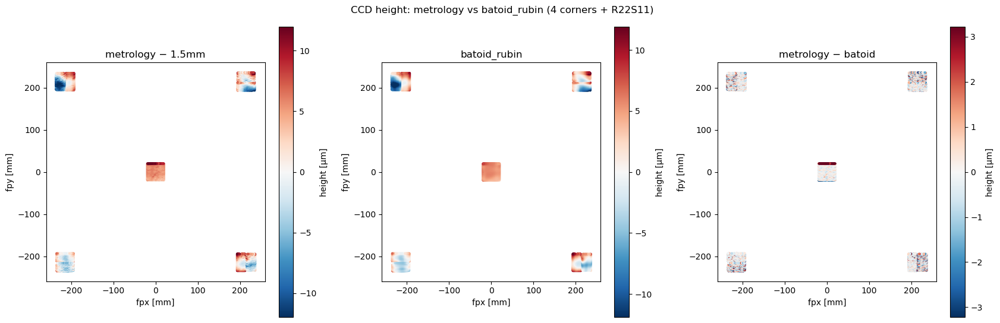

In [7]:
import numpy as np, astropy.io.fits as fits, matplotlib.pyplot as plt, os, sys
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code'))
import ccd_height as cch
from batoid_rubin.builder import det_height_maps

FITS = os.path.expanduser('~/notebooks/AOS/metrology/LSST_FP_cold_b_measurement_4col_bysurface.fits')
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')
DEFOCAL_MM = 1.5      # corner-WFS nominal piston: SW0/extra +, SW1/intra -  (flip if a residual offset remains)

# metrology extname -> (cameraGeom det, piston_mm to subtract)
targets = {}
for raft in ['R00', 'R04', 'R40', 'R44']:
    targets[f'{raft}WFS0'] = (f'{raft}_SW0', +DEFOCAL_MM)   # extra
    targets[f'{raft}WFS1'] = (f'{raft}_SW1', -DEFOCAL_MM)   # intra
targets['R22S11'] = ('R22_S11', 0.0)                        # one science CCD (at focus)

fpx, fpy, zmet, dets = [], [], [], []
with fits.open(FITS) as hd:
    for h in hd:
        en = h.header.get('EXTNAME', '')
        if en in targets:
            det, piston = targets[en]; t = h.data
            fpx += list(np.asarray(t['Y_CCS'], float)); fpy += list(np.asarray(t['X_CCS'], float))
            zmet += list(np.asarray(t['Z_CCS_MEASURED'], float) - piston); dets += [det]*len(t)
fpx, fpy, zmet, dets = map(np.asarray, (fpx, fpy, zmet, dets))
print(f"{len(fpx)} metrology points over {sorted(set(dets))}")

# --- pick orientation by AGREEMENT with metrology (replaces _detect_fp_orientation) ---
maps = det_height_maps(cch._resolve_ccd_height_map_dir(HMAP))
cands = []
for swap in (False, True):
    for sx in (1, -1):
        for sy in (1, -1):
            zb = cch._sag_oriented(maps, fpx, fpy, dets, swap, sx, sy)
            m = np.isfinite(zb)
            rms = np.sqrt(np.nanmean((zmet[m]-zb[m])**2)) if m.sum() else np.inf
            cands.append((swap, sx, sy, int(m.sum()), rms))
            print(f"  swap={str(swap):5} sx={sx:+d} sy={sy:+d}: n_fin={m.sum():6d}/{len(zb)}  RMS={rms*1e3:9.3f} um")
nmax = max(c[3] for c in cands)
swap, sx, sy, nf, rms = min((c for c in cands if c[3] >= 0.9*nmax), key=lambda c: c[4])
print(f"chosen orientation: swap={swap} sx={sx} sy={sy}  (n_fin={nf}, RMS={rms*1e3:.3f} um)")
zbat = cch._sag_oriented(maps, fpx, fpy, dets, swap, sx, sy)

# --- maps: metrology | batoid | difference (µm) ---
fig, ax = plt.subplots(1, 3, figsize=(17, 5.5))
for a, (z, ttl) in zip(ax, [(zmet, 'metrology − 1.5mm'), (zbat, 'batoid_rubin'), (zmet-zbat, 'metrology − batoid')]):
    zu = z*1e3; fin = np.isfinite(zu)
    vmax = float(np.nanpercentile(np.abs(zu[fin]), 98)) if fin.any() else 1.0
    sc = a.scatter(fpx, fpy, c=zu, s=4, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    a.set_aspect('equal'); a.set_title(ttl); a.set_xlabel('fpx [mm]'); a.set_ylabel('fpy [mm]')
    plt.colorbar(sc, ax=a, label='height [µm]')
plt.suptitle('CCD height: metrology vs batoid_rubin (4 corners + R22S11)'); plt.tight_layout(); plt.show()

In [8]:
import os, sys, numpy as np, pandas as pd
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code'))
import ccd_height as cch
from lsst.obs.lsst import LsstCam
camera = LsstCam.getCamera()
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')
FITS = os.path.expanduser('~/notebooks/AOS/metrology/LSST_FP_cold_b_measurement_4col_bysurface.fits')
FACTOR = cch.HEIGHT_TO_Z4_UM_PER_MM
raft = str(row['detector'])[:3]

def h_and_z4(det, cx, cy, source):                       # orientation now fixed -> single point is fine
    df = pd.DataFrame({'detector':[det],'centroid_x_intra':[cx],'centroid_y_intra':[cy],
                       'centroid_x_extra':[cx],'centroid_y_extra':[cy]})
    kw = {'height_map_dir':HMAP} if source=='batoid_rubin' else {'metrology_fits':FITS}
    H = cch.compute_ccd_heights(df, camera, source=source, factor=FACTOR, **kw)
    return float(H['ccd_height_mean'][0])*1e3, float(H['Z4_height'][0])   # height µm, Z4 µm

locs = [('extra', f'{raft}_SW0', row['centroid_x_extra'], row['centroid_y_extra']),
        ('intra', f'{raft}_SW1', row['centroid_x_intra'], row['centroid_y_intra'])]
print(f"\n=== {raft} sample pair: CCD-height figure & Z4 offset at each donut ===")
print(f"{'loc':6s}{'detector':10s}{'source':14s}{'height[µm]':>12s}{'Z4 offset[µm]':>15s}")
res = {}
for loc, det, cx, cy in locs:
    for src in ('batoid_rubin','metrology'):
        h_um, z4 = h_and_z4(det, cx, cy, src); res[(loc,src)] = z4
        print(f"{loc:6s}{det:10s}{src:14s}{h_um:12.3f}{z4:15.4f}")

# context: the nominal off-axis defocus Z4 that getOffAxisCoeff already carries (±~24 µm)
for loc, stamp in [('extra', extra_stamp), ('intra', intra_stamp)]:
    wi = stamp.wep_im
    oa = inst.getOffAxisCoeff(wi.fieldAngle[0], wi.fieldAngle[1], wi.defocalType, wi.bandLabel,
                              nollIndicesModel=np.arange(0,79), nollIndicesIntr=noll)
    print(f"  {loc}: nominal off-axis Z4 (defocus) = {oa[4]*1e6:+8.3f} µm   "
          f"CCD-height Z4 (batoid) = {res[(loc,'batoid_rubin')]:+.4f} µm")

print("\n=== Did ts_wep's pipeline danish fit include the CCD-height Z4? ===")
print(f"  ts_wep batoid model = {inst.batoidModelName!r}  -> NOMINAL optical design, no per-CCD height maps.")
print("  => NO. The stored pipeline zk_deviation_CCS / donutStamps fit did NOT include the CCD-height Z4.")
print("     It's only present if injected, as in our refit:  zkStart[Z4] += Z4_height * 1e-6.")


=== R44 sample pair: CCD-height figure & Z4 offset at each donut ===
loc   detector  source          height[µm]  Z4 offset[µm]
  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
extra R44_SW0   batoid_rubin        -0.155        -0.0023


  CCD heights (metrology): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
extra R44_SW0   metrology           -0.585        -0.0088
  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
intra R44_SW1   batoid_rubin        -0.476        -0.0071


  CCD heights (metrology): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
intra R44_SW1   metrology           -1.078        -0.0162
  extra: nominal off-axis Z4 (defocus) =  +23.916 µm   CCD-height Z4 (batoid) = -0.0023 µm
  intra: nominal off-axis Z4 (defocus) =  -23.952 µm   CCD-height Z4 (batoid) = -0.0071 µm

=== Did ts_wep's pipeline danish fit include the CCD-height Z4? ===
  ts_wep batoid model = 'LSST_{band}'  -> NOMINAL optical design, no per-CCD height maps.
  => NO. The stored pipeline zk_deviation_CCS / donutStamps fit did NOT include the CCD-height Z4.
     It's only present if injected, as in our refit:  zkStart[Z4] += Z4_height * 1e-6.


  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1600/1600  (factor=15 μm/mm)


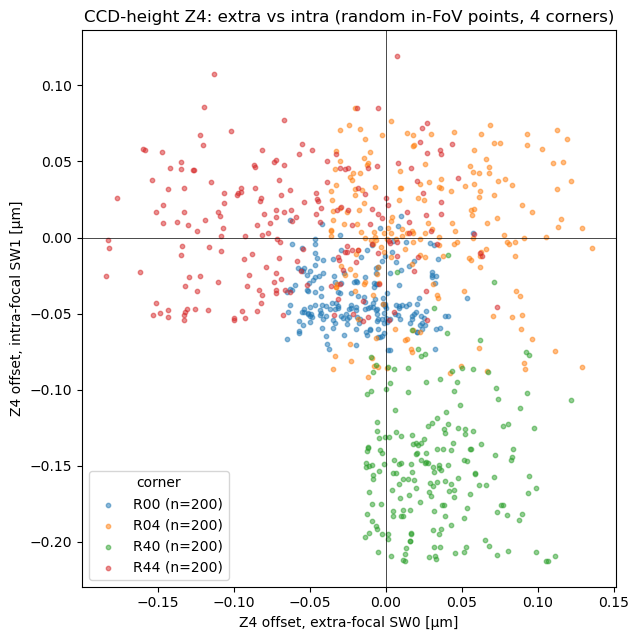

extra (SW0): mean=-0.0045  RMS=0.0573  µm  (n=800)
intra (SW1): mean=-0.0445  RMS=0.0852  µm  (n=800)

per corner (extra | intra mean±RMS):
  R00: extra -0.016/0.033   intra -0.040/0.044 µm
  R04: extra +0.027/0.052   intra +0.003/0.044 µm
  R40: extra +0.033/0.045   intra -0.149/0.154 µm
  R44: extra -0.062/0.085   intra +0.007/0.038 µm


In [9]:
import os, sys, numpy as np, pandas as pd, matplotlib.pyplot as plt
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code'))
import ccd_height as cch
from lsst.obs.lsst import LsstCam
from lsst.afw.cameraGeom import PIXELS, FIELD_ANGLE
import lsst.geom as geom
camera = LsstCam.getCamera()
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')
rng = np.random.default_rng(0)

N, EDGE, RMAX = 200, 80, 1.725          # points/half-chip, px from edge, FoV radius (deg)
corners = ['R00', 'R04', 'R40', 'R44']

recs = []
for raft in corners:
    for sw, foc in [('SW0', 'extra'), ('SW1', 'intra')]:
        det = camera[f'{raft}_{sw}']; bb = det.getBBox()
        tr = det.getTransform(PIXELS, FIELD_ANGLE)
        px = rng.uniform(bb.getMinX()+EDGE, bb.getMaxX()-EDGE, 3000)
        py = rng.uniform(bb.getMinY()+EDGE, bb.getMaxY()-EDGE, 3000)
        kept = 0
        for x, y in zip(px, py):
            fa = tr.applyForward(geom.Point2D(x, y))
            if np.degrees(np.hypot(fa.getX(), fa.getY())) <= RMAX:
                recs.append({'raft': raft, 'foc': foc, 'detector': f'{raft}_{sw}', 'px': x, 'py': y})
                kept += 1
                if kept >= N:
                    break
df = pd.DataFrame(recs)
for c in ['centroid_x_intra', 'centroid_x_extra']: df[c] = df['px']
for c in ['centroid_y_intra', 'centroid_y_extra']: df[c] = df['py']
df['z4'] = cch.compute_ccd_heights(df, camera, source='batoid_rubin', height_map_dir=HMAP)['Z4_height']
df = df[np.isfinite(df['z4'])].reset_index(drop=True)

# scatter: Z4 extra (SW0) vs intra (SW1), index-paired within each corner
fig, ax = plt.subplots(figsize=(6.5, 6.5))
col = {'R00': 'tab:blue', 'R04': 'tab:orange', 'R40': 'tab:green', 'R44': 'tab:red'}
for raft in corners:
    e = df[(df.raft == raft) & (df.foc == 'extra')]['z4'].values
    i = df[(df.raft == raft) & (df.foc == 'intra')]['z4'].values
    n = min(len(e), len(i))
    ax.scatter(e[:n], i[:n], s=10, alpha=0.5, color=col[raft], label=f'{raft} (n={n})')
ax.axhline(0, color='k', lw=0.5); ax.axvline(0, color='k', lw=0.5); ax.set_aspect('equal')
ax.set_xlabel('Z4 offset, extra-focal SW0 [µm]'); ax.set_ylabel('Z4 offset, intra-focal SW1 [µm]')
ax.set_title('CCD-height Z4: extra vs intra (random in-FoV points, 4 corners)')
ax.legend(title='corner'); plt.tight_layout(); plt.show()

def stat(z): return f"mean={z.mean():+.4f}  RMS={np.sqrt((z**2).mean()):.4f}  µm  (n={len(z)})"
ze, zi = df[df.foc == 'extra']['z4'], df[df.foc == 'intra']['z4']
print("extra (SW0):", stat(ze))
print("intra (SW1):", stat(zi))
print("\nper corner (extra | intra mean±RMS):")
for raft in corners:
    e = df[(df.raft == raft) & (df.foc == 'extra')]['z4']; i = df[(df.raft == raft) & (df.foc == 'intra')]['z4']
    print(f"  {raft}: extra {e.mean():+.3f}/{np.sqrt((e**2).mean()):.3f}   "
          f"intra {i.mean():+.3f}/{np.sqrt((i**2).mean()):.3f} µm")

  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
CCD-height Z4 injected: extra/SW0=-0.0023  intra/SW1=-0.0071 um


triangle+height: success=True cost=4.575e+06 nfev=5 fwhm=0.734
extra: sum|resid|  old=0.3137  new=0.2864
intra: sum|resid|  old=0.2050  new=0.1760


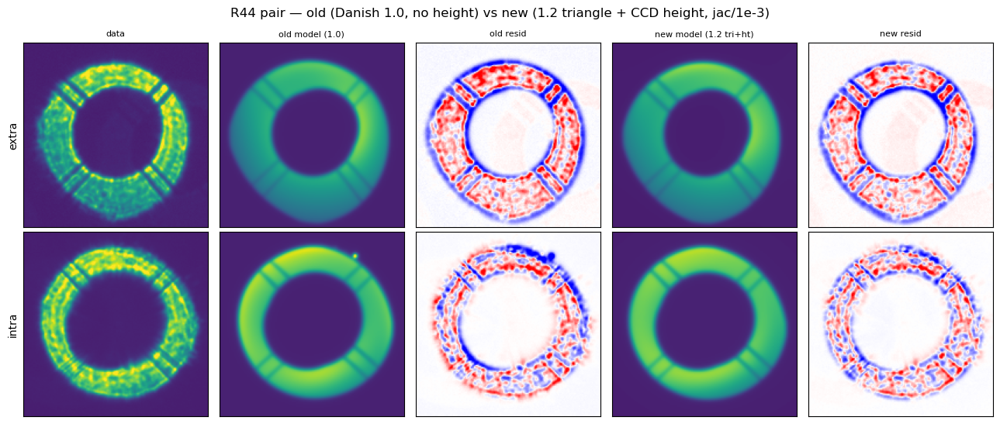

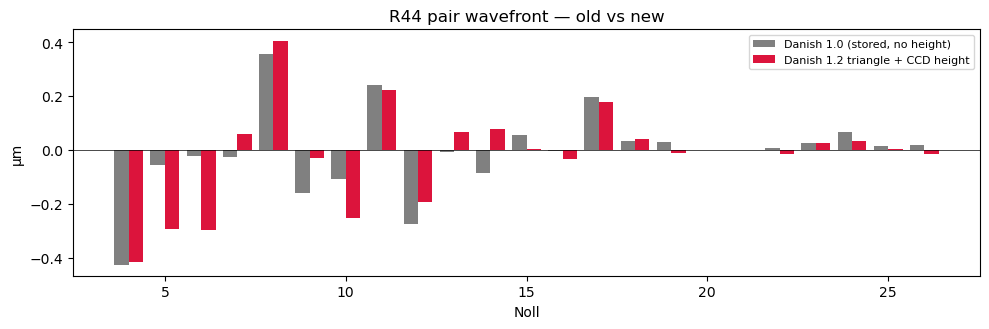

Z4: old=-0.4260  new(tri+ht)=-0.4169 um


In [10]:
import os, sys, numpy as np, pandas as pd, matplotlib.pyplot as plt
import danish
from scipy.optimize import least_squares
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code')); import ccd_height as cch

REPO, COLL = '/repo/main', 'LSSTCam/runs/aos/cwfs/danish_1_0/wep_17_3_0/dv_4_2_0/bin_x2'
DAY, SEQ, RAFT = 20260315, 231, 'R44'
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')
binning, BKG_ORDER = 1, 2
LSTSQ = dict(x_scale='jac', ftol=1e-3, xtol=1e-3, gtol=1e-3, max_nfev=30)   # production danish lstsqKwargs

butler = Butler(REPO, collections=COLL); camera = LsstCam.getCamera()
inst = getTaskInstrument("LSSTCam", "R00_SW0", None); algo = DanishAlgorithm()
DET = camera[f'{RAFT}_SW0'].getId()
es  = butler.get('donutStampsExtra', day_obs=DAY, seq_num=SEQ, detector=DET)
is_ = butler.get('donutStampsIntra', day_obs=DAY, seq_num=SEQ, detector=DET)
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY, seq_num=SEQ)
noll = [int(x) for x in agg.meta['nollIndices']]; ei = agg.meta['estimatorInfo']; i4 = noll.index(4)
KEYS = ['fit_success','fwhm','model_bkg','model_dx','model_dy','model_flux']
i0 = np.where((np.asarray(agg['detector']).astype(str)==f'{RAFT}_SW0') & np.asarray(agg['used']))[0][0]
row = agg[i0]; meta_old = {k: np.asarray(ei[k])[i0] for k in KEYS}
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])
ex  = es[int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))]
inn = is_[int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))]

# --- per-CCD height Z4 (batoid_rubin) -> per-donut zkStart ---
def hz4(det, cx, cy):
    df = pd.DataFrame({'detector':[det],'centroid_x_intra':[cx],'centroid_y_intra':[cy],
                       'centroid_x_extra':[cx],'centroid_y_extra':[cy]})
    return float(cch.compute_ccd_heights(df, camera, source='batoid_rubin', height_map_dir=HMAP)['Z4_height'][0])
z4_e = hz4(f'{RAFT}_SW0', row['centroid_x_extra'], row['centroid_y_extra'])
z4_i = hz4(f'{RAFT}_SW1', row['centroid_x_intra'], row['centroid_y_intra'])
zk_int = np.asarray(row['zk_intrinsic_CCS'])*1e-6
zkS_e = zk_int.copy(); zkS_e[i4] += z4_e*1e-6
zkS_i = zk_int.copy(); zkS_i[i4] += z4_i*1e-6
print(f"CCD-height Z4 injected: extra/SW0={z4_e:+.4f}  intra/SW1={z4_i:+.4f} um")

md = es.metadata
rtp = np.rad2deg(md["BORESIGHT_PAR_ANGLE_RAD"] - md["BORESIGHT_ROT_ANGLE_RAD"] - np.pi/2)
fkw = dict(R_outer=inst.radius, R_inner=inst.radius*inst.obscuration, mask_params=inst.maskParams,
           focal_length=inst.focalLength, pixel_scale=inst.pixelSize*binning, spider_angle=rtp)
dz_terms = [(1, j) for j in noll]

# --- NEW: triangle factory + height-aware refit (production lstsqKwargs) ---
ie, ae, ze, bge = algo._prepDanish(image=ex.wep_im,  zkStart=zkS_e, nollIndices=noll, instrument=inst)
ii, ai, zi, bgi = algo._prepDanish(image=inn.wep_im, zkStart=zkS_i, nollIndices=noll, instrument=inst)
imgs, sky, zkRefs = [ie, ii], [bge**2, bgi**2], [ze, zi]            # sky = background VARIANCE
thxs, thys = [ae[0], ai[0]], [ae[1], ai[1]]
mdl = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw), z_refs=zkRefs, dz_terms=dz_terms,
        field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER)
x0 = mdl.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                     fwhm=1.0, bkgs=[[0.]*mdl.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
bn = mdl.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                     bkgs=[[[-np.inf,np.inf]]*mdl.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
bn = [list(b) for b in zip(*bn)]; x0 = np.clip(x0, bn[0], bn[1])
r = least_squares(mdl.chi, jac=mdl.jac, x0=x0, args=(imgs, sky), bounds=bn, **LSTSQ)
p = mdl.unpack_params(r.x)
new_imgs = mdl.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], np.asarray(p['wavefront_params']), bkgs=p['bkgs'])
zk_new = (np.asarray(p['wavefront_params']) + np.mean([zkS_e, zkS_i], axis=0))*1e6
print(f"triangle+height: success={r.success} cost={r.cost:.3e} nfev={r.nfev} fwhm={p['fwhm']:.3f}")

# --- OLD: stored Danish-1.0 round model (no height) ---
nbkg = np.asarray(meta_old['model_bkg']).shape[1]; bko = int(np.sqrt(9+8*(nbkg-1))-3)//2
_, _, ze0, _ = algo._prepDanish(image=ex.wep_im,  zkStart=zk_int, nollIndices=noll, instrument=inst)
_, _, zi0, _ = algo._prepDanish(image=inn.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
mod0 = danish.DZMultiDonutModel(danish.DonutFactory(**fkw), z_refs=[ze0, zi0], dz_terms=dz_terms,
        field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=bko)
zk_fit0 = (np.asarray(row['zk_deviation_CCS']) - np.asarray(row['zk_intrinsic_CCS']))*1e-6
old_imgs = mod0.model(meta_old['model_flux'], meta_old['model_dx'], meta_old['model_dy'],
                      meta_old['fwhm'], zk_fit0, bkgs=[tuple(b) for b in meta_old['model_bkg']])

# --- plot: rows extra/intra; data | old model | old resid | new model | new resid ---
def nrm(a): s = np.sum(a); return a/s if s > 0 else a
labels = ['data', 'old model (1.0)', 'old resid', 'new model (1.2 tri+ht)', 'new resid']
fig, ax = plt.subplots(2, 5, figsize=(13, 5.6))
for rr, (d, om, nm) in enumerate([(ie, old_imgs[0], new_imgs[0]), (ii, old_imgs[1], new_imgs[1])]):
    d, om, nm = nrm(d), nrm(om), nrm(nm); vmax = float(np.nanquantile(d, 0.99))
    for c, (img, kind) in enumerate([(d,'d'),(om,'d'),(d-om,'r'),(nm,'d'),(d-nm,'r')]):
        a = ax[rr, c]; a.set_xticks([]); a.set_yticks([])
        a.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vmax/3 if kind=='r' else -vmax/10), vmax=(vmax/3 if kind=='r' else vmax))
        if rr == 0: a.set_title(labels[c], fontsize=8)
    ax[rr, 0].set_ylabel(['extra','intra'][rr])
    print(f"{['extra','intra'][rr]}: sum|resid|  old={np.sum(np.abs(d-om)):.4f}  new={np.sum(np.abs(d-nm)):.4f}")
fig.suptitle(f'{RAFT} pair — old (Danish 1.0, no height) vs new (1.2 triangle + CCD height, jac/1e-3)')
plt.tight_layout(); plt.show()

old = np.asarray(row['zk_deviation_CCS'], float)
fig2, axb = plt.subplots(figsize=(10, 3.4))
axb.bar(np.array(noll)-0.2, old,    0.4, color='gray',    label='Danish 1.0 (stored, no height)')
axb.bar(np.array(noll)+0.2, zk_new, 0.4, color='crimson', label='Danish 1.2 triangle + CCD height')
axb.axhline(0, color='k', lw=0.5); axb.legend(fontsize=8); axb.set_xlabel('Noll'); axb.set_ylabel('µm')
axb.set_title(f'{RAFT} pair wavefront — old vs new'); plt.tight_layout(); plt.show()
print(f"Z4: old={old[i4]:+.4f}  new(tri+ht)={zk_new[i4]:+.4f} um")

  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
CCD-height Z4 injected: extra/SW0=-0.0023  intra/SW1=-0.0071 um
pupil [m]:  new fit (4.165, 2.5833)   |   old render (4.1800, 2.5582)



blur/fwhm:  old(stored)=0.7257   new(tri+ht)=0.7674
fit: success=True cost=5.856e+06 nfev=6
extra: sum|resid|  old=0.3137  new=0.3753
intra: sum|resid|  old=0.2050  new=0.1788


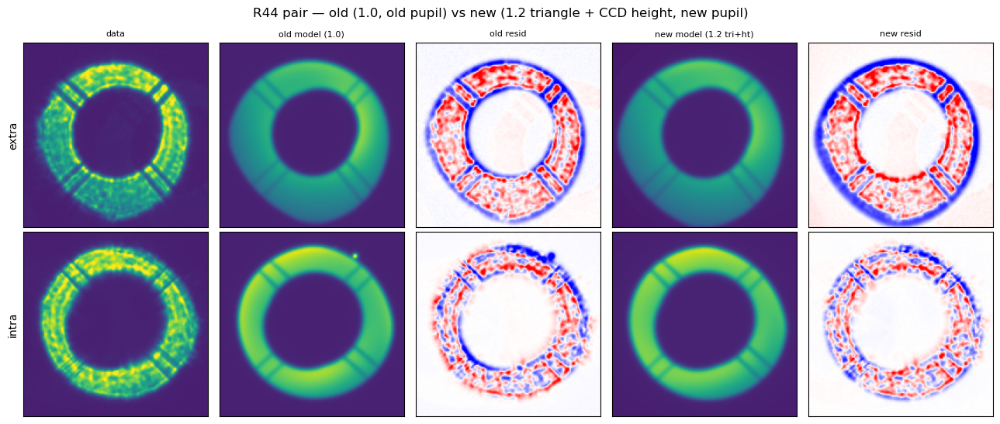

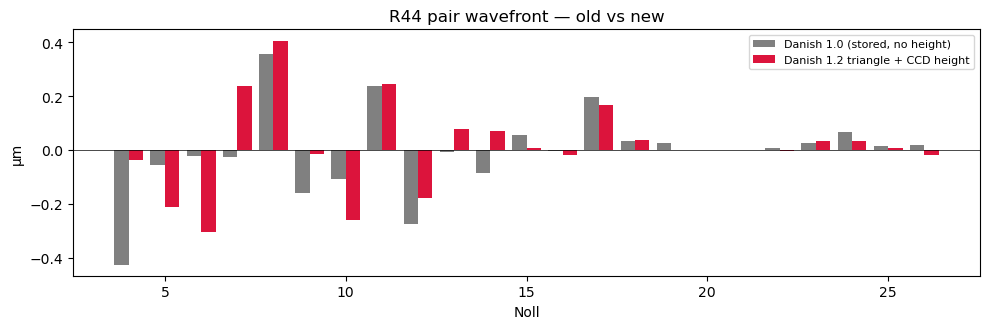

Z4: old=-0.4260  new(tri+ht)=-0.0382 um


In [11]:
import os, sys, numpy as np, pandas as pd, matplotlib.pyplot as plt
import danish
from scipy.optimize import least_squares
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code')); import ccd_height as cch

REPO, COLL = '/repo/main', 'LSSTCam/runs/aos/cwfs/danish_1_0/wep_17_3_0/dv_4_2_0/bin_x2'
DAY, SEQ, RAFT = 20260315, 231, 'R44'
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')
binning, BKG_ORDER = 1, 2
LSTSQ = dict(x_scale='jac', ftol=1e-3, xtol=1e-3, gtol=1e-3, max_nfev=30)   # production danish lstsqKwargs
R_OUTER, R_INNER = 4.165, 2.5833    # NEW M1M3 pupil radii (m), Roberto ~2 wks ago (old: 4.18, 2.558)


butler = Butler(REPO, collections=COLL); camera = LsstCam.getCamera()
inst = getTaskInstrument("LSSTCam", "R00_SW0", None); algo = DanishAlgorithm()
DET = camera[f'{RAFT}_SW0'].getId()
es  = butler.get('donutStampsExtra', day_obs=DAY, seq_num=SEQ, detector=DET)
is_ = butler.get('donutStampsIntra', day_obs=DAY, seq_num=SEQ, detector=DET)
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY, seq_num=SEQ)
noll = [int(x) for x in agg.meta['nollIndices']]; ei = agg.meta['estimatorInfo']; i4 = noll.index(4)
KEYS = ['fit_success','fwhm','model_bkg','model_dx','model_dy','model_flux']
i0 = np.where((np.asarray(agg['detector']).astype(str)==f'{RAFT}_SW0') & np.asarray(agg['used']))[0][0]
row = agg[i0]; meta_old = {k: np.asarray(ei[k])[i0] for k in KEYS}
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])
ex  = es[int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))]
inn = is_[int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))]

# --- per-CCD height Z4 (batoid_rubin) -> per-donut zkStart ---
def hz4(det, cx, cy):
    df = pd.DataFrame({'detector':[det],'centroid_x_intra':[cx],'centroid_y_intra':[cy],
                       'centroid_x_extra':[cx],'centroid_y_extra':[cy]})
    return float(cch.compute_ccd_heights(df, camera, source='batoid_rubin', height_map_dir=HMAP)['Z4_height'][0])
z4_e = hz4(f'{RAFT}_SW0', row['centroid_x_extra'], row['centroid_y_extra'])
z4_i = hz4(f'{RAFT}_SW1', row['centroid_x_intra'], row['centroid_y_intra'])
zk_int = np.asarray(row['zk_intrinsic_CCS'])*1e-6
zkS_e = zk_int.copy(); zkS_e[i4] += z4_e*1e-6
zkS_i = zk_int.copy(); zkS_i[i4] += z4_i*1e-6
print(f"CCD-height Z4 injected: extra/SW0={z4_e:+.4f}  intra/SW1={z4_i:+.4f} um")

md = es.metadata
rtp = np.rad2deg(md["BORESIGHT_PAR_ANGLE_RAD"] - md["BORESIGHT_ROT_ANGLE_RAD"] - np.pi/2)
base_fkw = dict(mask_params=inst.maskParams, focal_length=inst.focalLength,
                pixel_scale=inst.pixelSize*binning, spider_angle=rtp)
fkw_new = dict(R_outer=R_OUTER, R_inner=R_INNER, **base_fkw)                               # new pupil
fkw_old = dict(R_outer=inst.radius, R_inner=inst.radius*inst.obscuration, **base_fkw)      # stored-fit pupil
print(f"pupil [m]:  new fit ({R_OUTER}, {R_INNER})   |   old render "
      f"({inst.radius:.4f}, {inst.radius*inst.obscuration:.4f})")
dz_terms = [(1, j) for j in noll]

# --- NEW: triangle factory (new pupil) + height-aware refit ---
ie, ae, ze, bge = algo._prepDanish(image=ex.wep_im,  zkStart=zkS_e, nollIndices=noll, instrument=inst)
ii, ai, zi, bgi = algo._prepDanish(image=inn.wep_im, zkStart=zkS_i, nollIndices=noll, instrument=inst)
imgs, sky, zkRefs = [ie, ii], [bge**2, bgi**2], [ze, zi]            # sky = background VARIANCE
thxs, thys = [ae[0], ai[0]], [ae[1], ai[1]]
mdl = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw_new), z_refs=zkRefs, dz_terms=dz_terms,
        field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER)
x0 = mdl.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                     fwhm=1.0, bkgs=[[0.]*mdl.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
bn = mdl.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                     bkgs=[[[-np.inf,np.inf]]*mdl.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
bn = [list(b) for b in zip(*bn)]; x0 = np.clip(x0, bn[0], bn[1])
r = least_squares(mdl.chi, jac=mdl.jac, x0=x0, args=(imgs, sky), bounds=bn, **LSTSQ)
p = mdl.unpack_params(r.x)
new_imgs = mdl.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], np.asarray(p['wavefront_params']), bkgs=p['bkgs'])
zk_new = (np.asarray(p['wavefront_params']) + np.mean([zkS_e, zkS_i], axis=0))*1e6

# --- OLD: stored Danish-1.0 round model (old pupil, no height) ---
nbkg = np.asarray(meta_old['model_bkg']).shape[1]; bko = int(np.sqrt(9+8*(nbkg-1))-3)//2
_, _, ze0, _ = algo._prepDanish(image=ex.wep_im,  zkStart=zk_int, nollIndices=noll, instrument=inst)
_, _, zi0, _ = algo._prepDanish(image=inn.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
mod0 = danish.DZMultiDonutModel(danish.DonutFactory(**fkw_old), z_refs=[ze0, zi0], dz_terms=dz_terms,
        field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=bko)
zk_fit0 = (np.asarray(row['zk_deviation_CCS']) - np.asarray(row['zk_intrinsic_CCS']))*1e-6
old_imgs = mod0.model(meta_old['model_flux'], meta_old['model_dx'], meta_old['model_dy'],
                      meta_old['fwhm'], zk_fit0, bkgs=[tuple(b) for b in meta_old['model_bkg']])

print(f"\nblur/fwhm:  old(stored)={meta_old['fwhm']:.4f}   new(tri+ht)={p['fwhm']:.4f}")
print(f"fit: success={r.success} cost={r.cost:.3e} nfev={r.nfev}")

# --- plot: rows extra/intra; data | old model | old resid | new model | new resid ---
def nrm(a): s = np.sum(a); return a/s if s > 0 else a
labels = ['data', 'old model (1.0)', 'old resid', 'new model (1.2 tri+ht)', 'new resid']
fig, ax = plt.subplots(2, 5, figsize=(13, 5.6))
for rr, (d, om, nm) in enumerate([(ie, old_imgs[0], new_imgs[0]), (ii, old_imgs[1], new_imgs[1])]):
    d, om, nm = nrm(d), nrm(om), nrm(nm); vmax = float(np.nanquantile(d, 0.99))
    for c, (img, kind) in enumerate([(d,'d'),(om,'d'),(d-om,'r'),(nm,'d'),(d-nm,'r')]):
        a = ax[rr, c]; a.set_xticks([]); a.set_yticks([])
        a.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vmax/3 if kind=='r' else -vmax/10), vmax=(vmax/3 if kind=='r' else vmax))
        if rr == 0: a.set_title(labels[c], fontsize=8)
    ax[rr, 0].set_ylabel(['extra','intra'][rr])
    print(f"{['extra','intra'][rr]}: sum|resid|  old={np.sum(np.abs(d-om)):.4f}  new={np.sum(np.abs(d-nm)):.4f}")
fig.suptitle(f'{RAFT} pair — old (1.0, old pupil) vs new (1.2 triangle + CCD height, new pupil)')
plt.tight_layout(); plt.show()

old = np.asarray(row['zk_deviation_CCS'], float)
fig2, axb = plt.subplots(figsize=(10, 3.4))
axb.bar(np.array(noll)-0.2, old,    0.4, color='gray',    label='Danish 1.0 (stored, no height)')
axb.bar(np.array(noll)+0.2, zk_new, 0.4, color='crimson', label='Danish 1.2 triangle + CCD height')
axb.axhline(0, color='k', lw=0.5); axb.legend(fontsize=8); axb.set_xlabel('Noll'); axb.set_ylabel('µm')
axb.set_title(f'{RAFT} pair wavefront — old vs new'); plt.tight_layout(); plt.show()
print(f"Z4: old={old[i4]:+.4f}  new(tri+ht)={zk_new[i4]:+.4f} um")

In [12]:
print(inst.maskParams)

{'M1': {'outer': {'clear': True, 'thetaMin': 0.0, 'thetaMax': 1.85, 'center': [5.94968e-11, -5.34043e-09, 7.82344e-08, -3.86466e-07], 'radius': [1.06259e-12, 1.27949e-12, 6.02422e-13, 4.18]}, 'inner': {'clear': False, 'thetaMin': 0.0, 'thetaMax': 1.85, 'center': [-3.87388e-07, -2.8971e-07, -0.00479205, -7.99935e-08], 'radius': [9.70741e-09, -2.59729e-08, -1.32368e-08, 2.558]}}, 'M2': {'outer': {'clear': True, 'thetaMin': 1.095, 'thetaMax': 1.818, 'center': [-0.000159006, 0.00157387, -0.291945, -3.46377e-05], 'radius': [-3.60097e-05, 0.000464994, 0.000350099, 4.49688]}, 'inner': {'clear': False, 'thetaMin': 0.653, 'thetaMax': 1.85, 'center': [-0.000217218, 1.05809e-05, -0.291126, 1.30227e-06], 'radius': [8.82205e-06, 0.000781438, 8.22495e-06, 2.3709]}}, 'M3': {'outer': {'clear': True, 'thetaMin': 1.399, 'thetaMax': 1.79, 'center': [-0.00111808, -0.00616835, -0.793911, -4.46707e-05], 'radius': [0.000135497, -0.000513756, 0.00237774, 5.21539]}, 'inner': {'clear': False, 'thetaMin': 1.784,

In [13]:
print(inst.maskParams.keys())

dict_keys(['M1', 'M2', 'M3', 'L1_entrance', 'Filter_entrance', 'Spider_3D'])


extra: sum|Δmodel (new−old pupil)| = 0.0980  (frozen wavefront)
intra: sum|Δmodel (new−old pupil)| = 0.1244  (frozen wavefront)


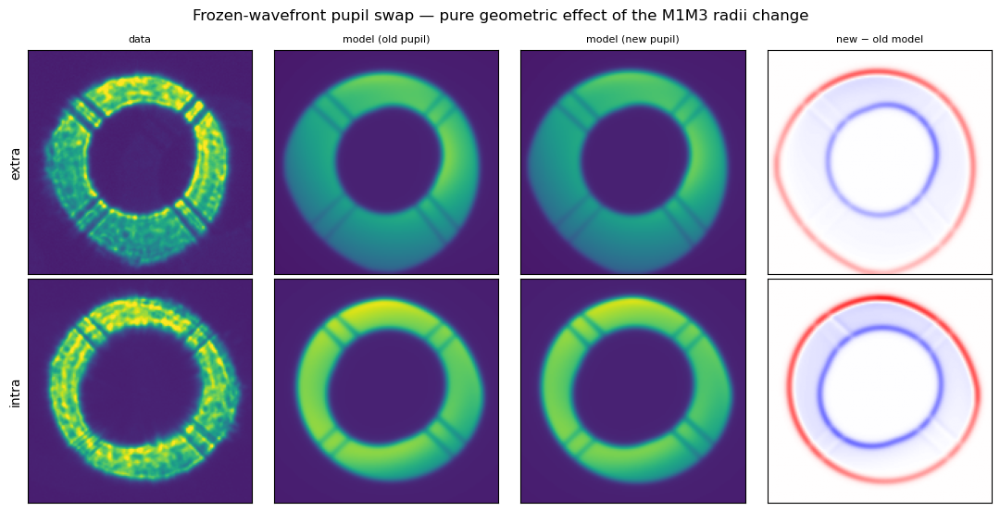

In [19]:
base_fkw = dict(mask_params=inst.maskParams, focal_length=inst.focalLength,
                pixel_scale=inst.pixelSize*binning, spider_angle=rtp)
fkw_new = dict(R_outer=4.165, R_inner=2.5833, **base_fkw)                            # new M1M3
fkw_old = dict(R_outer=inst.radius, R_inner=inst.radius*inst.obscuration, **base_fkw) # old (
)

def render(fkw):
    m = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw), z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER)
    return m.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'],
                   np.asarray(p['wavefront_params']), bkgs=p['bkgs'])           # FROZEN wavefront

m_new = render(fkw_new)     # [extra, intra]
m_old = render(fkw_old)     # same params, old pupil

def nrm(a): s = np.sum(a); return a/s if s > 0 else a
data = [ie, ii]; cols = ['data', 'model (old pupil)', 'model (new pupil)', 'new − old model']
fig, ax = plt.subplots(2, 4, figsize=(11, 5.6))
for rr in range(2):
    d, mo, mn = nrm(data[rr]), nrm(m_old[rr]), nrm(m_new[rr]); vmax = float(np.nanquantile(d, 0.99))
    for c, (img, kind) in enumerate([(d,'d'),(mo,'d'),(mn,'d'),(mn-mo,'r')]):
        a = ax[rr, c]; a.set_xticks([]); a.set_yticks([])
        a.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vmax/3 if kind=='r' else -vmax/10), vmax=(vmax/3 if kind=='r' else vmax))
        if rr == 0: a.set_title(cols[c], fontsize=8)
    ax[rr, 0].set_ylabel(['extra','intra'][rr])
    print(f"{['extra','intra'][rr]}: sum|Δmodel (new−old pupil)| = {np.sum(np.abs(mn-mo)):.4f}  (frozen wavefront)")
fig.suptitle('Frozen-wavefront pupil swap — pure geometric effect of the M1M3 radii change')
plt.tight_layout(); plt.show()

extra: total flux  old=4.9852e+07  new=5.0327e+07  (ratio 1.0095)
intra: total flux  old=1.3116e+08  new=1.3248e+08  (ratio 1.0101)


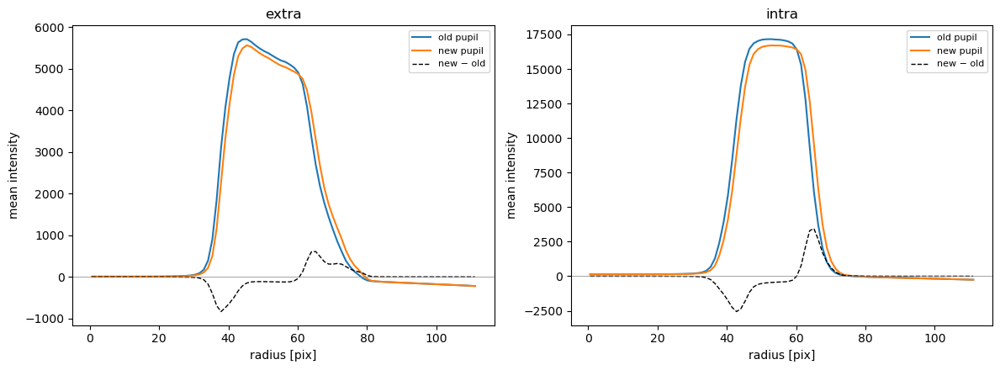

In [20]:
def radial_profile(img, nbins=90):
    ny, nx = img.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    r = np.hypot(xx - (nx-1)/2, yy - (ny-1)/2).ravel()
    v = img.ravel()
    edges = np.linspace(0, r.max(), nbins+1); k = np.clip(np.digitize(r, edges)-1, 0, nbins-1)
    prof = np.array([v[k == j].mean() if np.any(k == j) else np.nan for j in range(nbins)])
    return 0.5*(edges[:-1]+edges[1:]), prof

fig, ax = plt.subplots(1, 2, figsize=(12, 4.5))
for c, (mo, mn, lbl) in enumerate([(m_old[0], m_new[0], 'extra'), (m_old[1], m_new[1], 'intra')]):
    print(f"{lbl}: total flux  old={mo.sum():.5g}  new={mn.sum():.5g}  (ratio {mn.sum()/mo.sum():.4f})")
    rc, po = radial_profile(mo); _, pn = radial_profile(mn)
    a = ax[c]
    a.plot(rc, po, label='old pupil'); a.plot(rc, pn, label='new pupil')
    a.plot(rc, pn - po, 'k--', lw=1, label='new − old')
    a.axhline(0, color='gray', lw=0.5); a.set_title(lbl)
    a.set_xlabel('radius [pix]'); a.set_ylabel('mean intensity'); a.legend(fontsize=8)
plt.tight_layout(); plt.show()

 alpha       Z4       Z5       Z6       Z7       Z8   fwhm  nfev    resid


  0.00  -0.0382  -0.2131  -0.3051   0.2373   0.4069  0.767     6   0.5542


  0.05  -0.2677  -0.3063  -0.0500   0.1011   0.2467  0.687     5   0.5624


  0.10  -0.2321  -0.4112  -0.0217   0.1155   0.2411  0.730     9   0.5669


  0.15  -0.2691  -0.5259  -0.0163   0.0969   0.2014  0.748     9   0.5723


  0.20  -0.3246  -0.3778   0.0431   0.1838   0.3293  0.760     6   0.5791


  0.25  -0.3569  -0.3439  -0.0023   0.2043   0.3588  0.768     6   0.5818


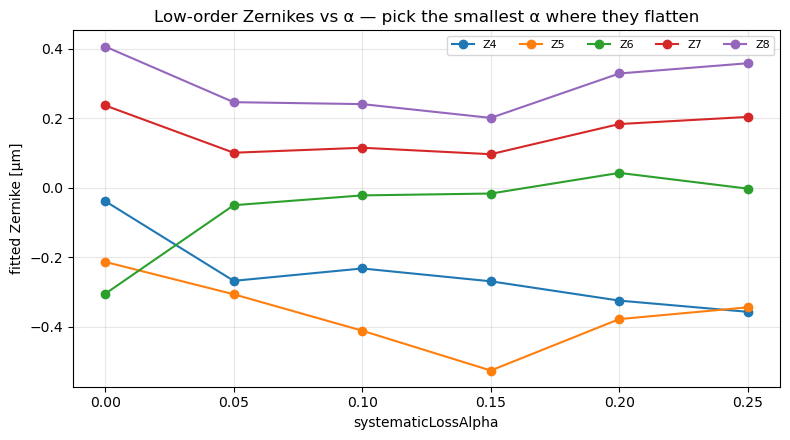

In [21]:
import danish, numpy as np, matplotlib.pyplot as plt
from scipy.optimize import least_squares

def refit(alpha):
    loss_fn = danish.systematic_loss(alpha) if alpha else None
    mkw = {'loss_fn': loss_fn} if loss_fn is not None else {}
    m = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw_new), z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER, **mkw)
    x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                       fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
    bnv = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                        bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
    bnv = [list(b) for b in zip(*bnv)]; x0 = np.clip(x0, bnv[0], bnv[1])
    rr = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs, sky), bounds=bnv, **LSTSQ)
    pp = m.unpack_params(rr.x)
    zk = (np.asarray(pp['wavefront_params']) + np.mean([zkS_e, zkS_i], axis=0))*1e6
    mi = m.model(pp['fluxes'], pp['dxs'], pp['dys'], pp['fwhm'], np.asarray(pp['wavefront_params']), bkgs=pp['bkgs'])
    res = sum(np.sum(np.abs(d/np.sum(d) - mm/np.sum(mm))) for d, mm in zip(imgs, mi))
    return zk, rr.cost, float(pp['fwhm']), rr.nfev, res

alphas = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25]
ZK = []
print(f"{'alpha':>6}{'Z4':>9}{'Z5':>9}{'Z6':>9}{'Z7':>9}{'Z8':>9}{'fwhm':>7}{'nfev':>6}{'resid':>9}")
for a in alphas:
    zk, cost, fw, nf, res = refit(a); ZK.append(zk)
    print(f"{a:6.2f}" + "".join(f"{zk[noll.index(j)]:9.4f}" for j in [4,5,6,7,8]) + f"{fw:7.3f}{nf:6d}{res:9.4f}")
ZK = np.array(ZK)

fig, ax = plt.subplots(figsize=(8, 4.5))
for j in [4, 5, 6, 7, 8]:
    ax.plot(alphas, ZK[:, noll.index(j)], '-o', label=f'Z{j}')
ax.set_xlabel('systematicLossAlpha'); ax.set_ylabel('fitted Zernike [µm]')
ax.set_title('Low-order Zernikes vs α — pick the smallest α where they flatten')
ax.grid(alpha=0.3); ax.legend(ncol=5, fontsize=8); plt.tight_layout(); plt.show()

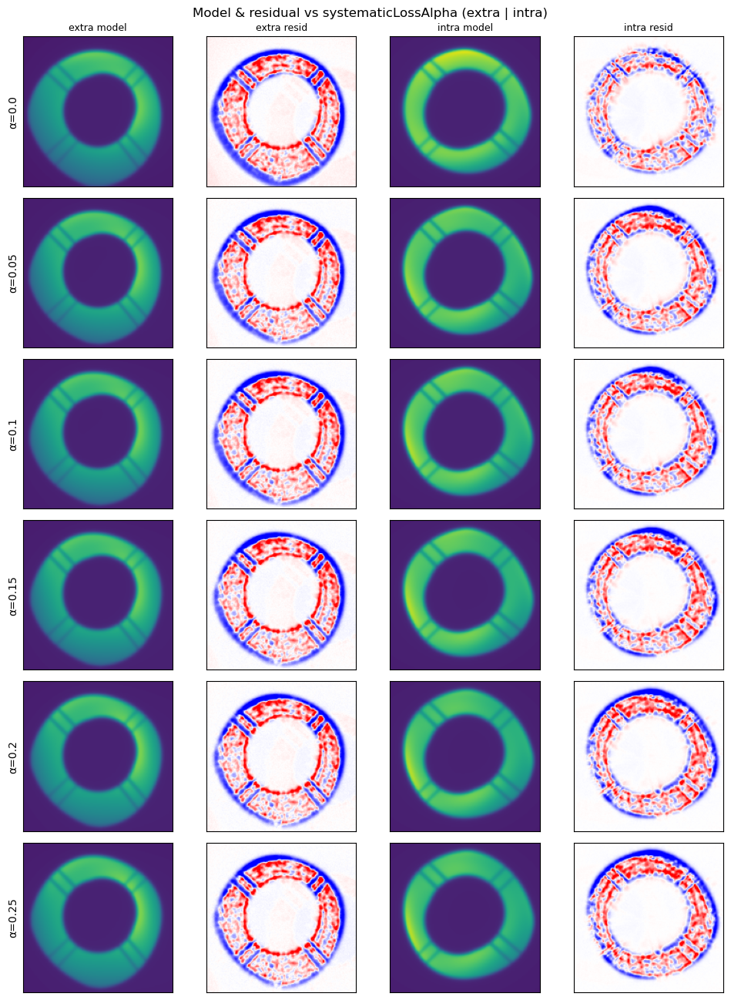

In [22]:
def refit_full(alpha):
    loss_fn = danish.systematic_loss(alpha) if alpha else None
    mkw = {'loss_fn': loss_fn} if loss_fn is not None else {}
    m = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw_new), z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER, **mkw)
    x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                       fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
    bnv = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                        bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
    bnv = [list(b) for b in zip(*bnv)]; x0 = np.clip(x0, bnv[0], bnv[1])
    rr = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs, sky), bounds=bnv, **LSTSQ)
    pp = m.unpack_params(rr.x)
    return m.model(pp['fluxes'], pp['dxs'], pp['dys'], pp['fwhm'],
                   np.asarray(pp['wavefront_params']), bkgs=pp['bkgs'])     # [extra, intra]

def nrm(a): s = np.sum(a); return a/s if s > 0 else a
alphas = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25]
de, di = nrm(ie), nrm(ii); ve, vi = float(np.nanquantile(de, 0.99)), float(np.nanquantile(di, 0.99))
fig, ax = plt.subplots(len(alphas), 4, figsize=(10, 2.2*len(alphas)))
cols = ['extra model', 'extra resid', 'intra model', 'intra resid']
for r, a in enumerate(alphas):
    me, mi = [nrm(x) for x in refit_full(a)]
    for c, (img, kind, vm) in enumerate([(me,'d',ve), (de-me,'r',ve), (mi,'d',vi), (di-mi,'r',vi)]):
        A = ax[r, c]; A.set_xticks([]); A.set_yticks([])
        A.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vm/3 if kind=='r' else -vm/10), vmax=(vm/3 if kind=='r' else vm))
        if r == 0: A.set_title(cols[c], fontsize=9)
    ax[r, 0].set_ylabel(f'α={a}', fontsize=10)
fig.suptitle('Model & residual vs systematicLossAlpha (extra | intra)')
plt.tight_layout(); plt.show()

 alpha       Z4       Z5       Z6       Z7       Z8   fwhm  nfev


  0.00  -0.0368  -0.2177  -0.3146   0.2303   0.3910  0.770    13


  0.05  -0.2166  -0.2819  -0.1786   0.1497   0.2987  0.698    23


  0.10  -0.2075  -0.4172  -0.0969   0.1444   0.2723  0.733    25


  0.15  -0.2150  -0.5351  -0.1265   0.1626   0.2598  0.751    75


  0.20  -0.3119  -0.7412  -0.0513   0.0735   0.2701  0.766    46


  0.25  -0.3450  -0.7845   0.0018   0.0704   0.2412  0.774    76


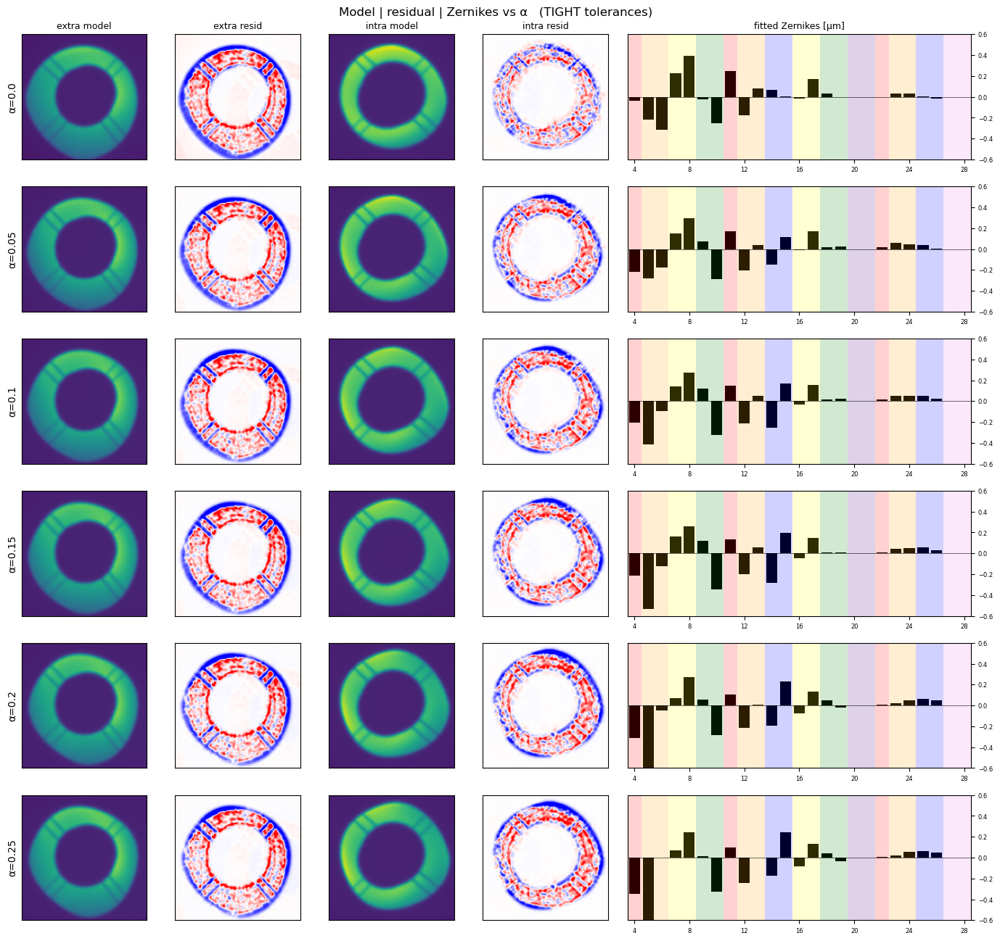

In [23]:
import danish, numpy as np, matplotlib.pyplot as plt
from scipy.optimize import least_squares

LSTSQ_LOOSE = dict(x_scale='jac', ftol=1e-3, xtol=1e-3, gtol=1e-3, max_nfev=30)    # production
LSTSQ_TIGHT = dict(x_scale='jac', ftol=1e-6, xtol=1e-6, gtol=1e-6, max_nfev=100)
LSTSQ = LSTSQ_TIGHT        # <-- set to LSTSQ_LOOSE to reproduce the earlier table

def draw_bars(ax, noll, zk, ylim=0.6):                      # donut_viz mode-group colours
    ax.bar(noll, zk, color='k')
    for j in [4,11,22]:  ax.axvspan(j-0.5, j+0.5, color='red',    alpha=0.18, ec='none')
    for j in [5,12,23]:  ax.axvspan(j-0.5, j+1.5, color='orange', alpha=0.18, ec='none')
    for j in [7,16]:     ax.axvspan(j-0.5, j+1.5, color='yellow', alpha=0.18, ec='none')
    for j in [9,18]:     ax.axvspan(j-0.5, j+1.5, color='green',  alpha=0.18, ec='none')
    for j in [14,25]:    ax.axvspan(j-0.5, j+1.5, color='blue',   alpha=0.18, ec='none')
    ax.axvspan(19.5,21.5, color='indigo', alpha=0.18, ec='none'); ax.axvspan(26.5,28.5, color='violet', alpha=0.18, ec='none')
    ax.axhline(0, color='k', lw=0.4); ax.set_ylim(-ylim, ylim); ax.set_xlim(3.5, 28.5)
    ax.set_xticks([4,8,12,16,20,24,28]); ax.tick_params(labelsize=6); ax.yaxis.tick_right()

def refit_full(alpha):
    loss_fn = danish.systematic_loss(alpha) if alpha else None
    mkw = {'loss_fn': loss_fn} if loss_fn is not None else {}
    m = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw_new), z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER, **mkw)
    x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                       fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
    bnv = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                        bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
    bnv = [list(b) for b in zip(*bnv)]; x0 = np.clip(x0, bnv[0], bnv[1])
    rr = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs, sky), bounds=bnv, **LSTSQ)
    pp = m.unpack_params(rr.x)
    zk = (np.asarray(pp['wavefront_params']) + np.mean([zkS_e, zkS_i], axis=0))*1e6
    mi = m.model(pp['fluxes'], pp['dxs'], pp['dys'], pp['fwhm'], np.asarray(pp['wavefront_params']), bkgs=pp['bkgs'])
    return mi, zk, rr.nfev, float(pp['fwhm'])

def nrm(a): s = np.sum(a); return a/s if s > 0 else a
alphas = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25]
de, di = nrm(ie), nrm(ii); ve, vi = float(np.nanquantile(de, 0.99)), float(np.nanquantile(di, 0.99))
fig, ax = plt.subplots(len(alphas), 5, figsize=(14, 2.2*len(alphas)),
                       gridspec_kw={'width_ratios': [1, 1, 1, 1, 2.4]})
cols = ['extra model', 'extra resid', 'intra model', 'intra resid', 'fitted Zernikes [µm]']
print(f"{'alpha':>6}{'Z4':>9}{'Z5':>9}{'Z6':>9}{'Z7':>9}{'Z8':>9}{'fwhm':>7}{'nfev':>6}")
for r, a in enumerate(alphas):
    mi, zk, nf, fw = refit_full(a); me, mii = nrm(mi[0]), nrm(mi[1])
    for c, (img, kind, vm) in enumerate([(me,'d',ve), (de-me,'r',ve), (mii,'d',vi), (di-mii,'r',vi)]):
        A = ax[r, c]; A.set_xticks([]); A.set_yticks([])
        A.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vm/3 if kind=='r' else -vm/10), vmax=(vm/3 if kind=='r' else vm))
        if r == 0: A.set_title(cols[c], fontsize=9)
    draw_bars(ax[r, 4], noll, zk)
    if r == 0: ax[r, 4].set_title(cols[4], fontsize=9)
    ax[r, 0].set_ylabel(f'α={a}', fontsize=10)
    print(f"{a:6.2f}" + "".join(f"{zk[noll.index(j)]:9.4f}" for j in [4,5,6,7,8]) + f"{fw:7.3f}{nf:6d}")
fig.suptitle(f'Model | residual | Zernikes vs α   ({"TIGHT" if LSTSQ is LSTSQ_TIGHT else "LOOSE"} tolerances)')
plt.tight_layout(); plt.show()

## now fixing the maskParms too!

  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
  ccd_height_map dir: /home/r/roodman/u/LSST/packages/batoid_rubin_data
  CCD heights (batoid_rubin): intra/extra average -> Z4_height n_finite=1/1  (factor=15 μm/mm)
old M1 mask radii: outer=4.18  inner=2.558   inst.radius=4.1800


blur/fwhm:  old(stored)=0.7257   new(tri+ht, new pupil+mask)=0.7860
fit: success=True cost=5.985e+06 nfev=14   Z4: old=-0.4260 new=-0.0188 um


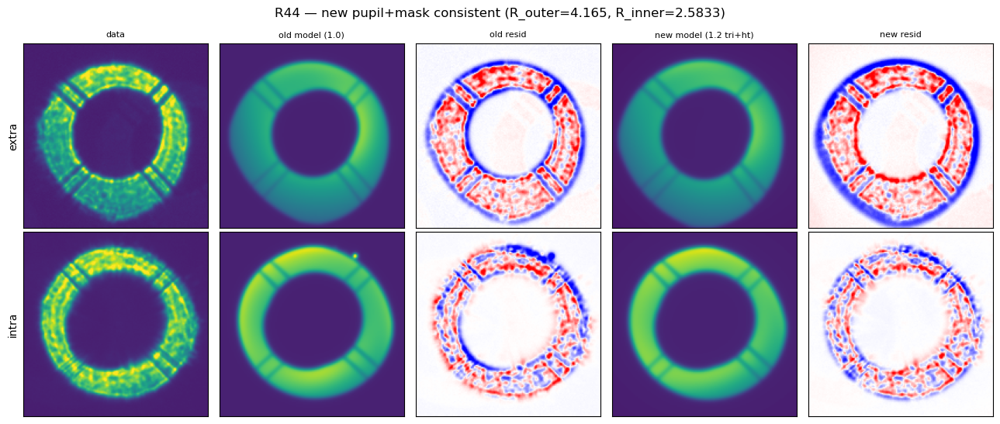

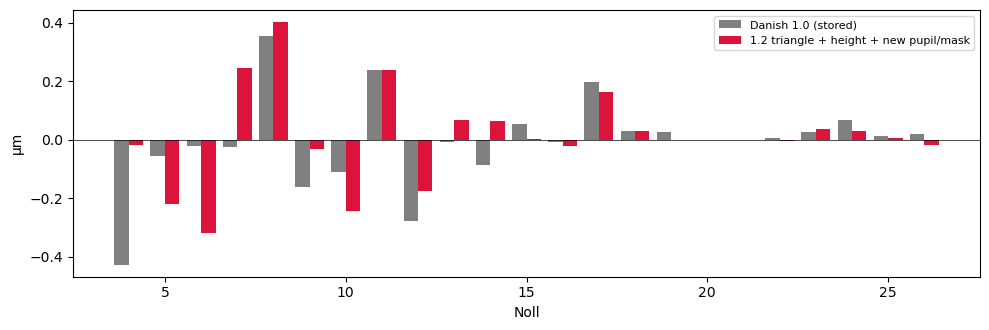

In [24]:
import os, sys, copy, numpy as np, pandas as pd, matplotlib.pyplot as plt
import danish
from scipy.optimize import least_squares
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument
sys.path.insert(0, os.path.expanduser('~/notebooks/rubin-work/aos/code')); import ccd_height as cch

REPO, COLL = '/repo/main', 'LSSTCam/runs/aos/cwfs/danish_1_0/wep_17_3_0/dv_4_2_0/bin_x2'
DAY, SEQ, RAFT = 20260315, 231, 'R44'
HMAP = os.path.expanduser('~/u/LSST/packages/batoid_rubin_data')
binning, BKG_ORDER = 1, 2
ALPHA = 0.0                                          # systematicLossAlpha (0 = production); try 0.1
LSTSQ = dict(x_scale='jac', ftol=1e-6, xtol=1e-6, gtol=1e-6, max_nfev=100)   # tight (well-converged)
R_OUTER, R_INNER = 4.165, 2.5833                     # NEW M1M3 radii (Roberto); old: 4.18, 2.558

butler = Butler(REPO, collections=COLL); camera = LsstCam.getCamera()
inst = getTaskInstrument("LSSTCam", "R00_SW0", None); algo = DanishAlgorithm()
DET = camera[f'{RAFT}_SW0'].getId()
es  = butler.get('donutStampsExtra', day_obs=DAY, seq_num=SEQ, detector=DET)
is_ = butler.get('donutStampsIntra', day_obs=DAY, seq_num=SEQ, detector=DET)
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY, seq_num=SEQ)
noll = [int(x) for x in agg.meta['nollIndices']]; ei = agg.meta['estimatorInfo']; i4 = noll.index(4)
KEYS = ['fit_success','fwhm','model_bkg','model_dx','model_dy','model_flux']
i0 = np.where((np.asarray(agg['detector']).astype(str)==f'{RAFT}_SW0') & np.asarray(agg['used']))[0][0]
row = agg[i0]; meta_old = {k: np.asarray(ei[k])[i0] for k in KEYS}
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])
ex  = es[int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))]
inn = is_[int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))]

# per-CCD height -> per-donut zkStart
def hz4(det, cx, cy):
    df = pd.DataFrame({'detector':[det],'centroid_x_intra':[cx],'centroid_y_intra':[cy],
                       'centroid_x_extra':[cx],'centroid_y_extra':[cy]})
    return float(cch.compute_ccd_heights(df, camera, source='batoid_rubin', height_map_dir=HMAP)['Z4_height'][0])
z4_e = hz4(f'{RAFT}_SW0', row['centroid_x_extra'], row['centroid_y_extra'])
z4_i = hz4(f'{RAFT}_SW1', row['centroid_x_intra'], row['centroid_y_intra'])
zk_int = np.asarray(row['zk_intrinsic_CCS'])*1e-6
zkS_e = zk_int.copy(); zkS_e[i4] += z4_e*1e-6
zkS_i = zk_int.copy(); zkS_i[i4] += z4_i*1e-6

md = es.metadata
rtp = np.rad2deg(md["BORESIGHT_PAR_ANGLE_RAD"] - md["BORESIGHT_ROT_ANGLE_RAD"] - np.pi/2)

# ---- FIX: M1 mask radii must match the chosen pupil radii ----
print(f"old M1 mask radii: outer={inst.maskParams['M1']['outer']['radius'][-1]}  "
      f"inner={inst.maskParams['M1']['inner']['radius'][-1]}   inst.radius={inst.radius:.4f}")
mp_new = copy.deepcopy(inst.maskParams)
mp_new['M1']['outer']['radius'][-1] = R_OUTER        # 4.165
mp_new['M1']['inner']['radius'][-1] = R_INNER        # 2.5833
fkw_new = dict(R_outer=R_OUTER, R_inner=R_INNER, mask_params=mp_new,
               focal_length=inst.focalLength, pixel_scale=inst.pixelSize*binning, spider_angle=rtp)
fkw_old = dict(R_outer=inst.radius, R_inner=inst.radius*inst.obscuration, mask_params=inst.maskParams,
               focal_length=inst.focalLength, pixel_scale=inst.pixelSize*binning, spider_angle=rtp)
dz_terms = [(1, j) for j in noll]

# ---- NEW: triangle (new pupil + new mask) + height-aware refit ----
ie, ae, ze, bge = algo._prepDanish(image=ex.wep_im,  zkStart=zkS_e, nollIndices=noll, instrument=inst)
ii, ai, zi, bgi = algo._prepDanish(image=inn.wep_im, zkStart=zkS_i, nollIndices=noll, instrument=inst)
imgs, sky, zkRefs = [ie, ii], [bge**2, bgi**2], [ze, zi]; thxs, thys = [ae[0], ai[0]], [ae[1], ai[1]]
loss_fn = danish.systematic_loss(ALPHA) if ALPHA else None
mkw = {'loss_fn': loss_fn} if loss_fn is not None else {}
mdl = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw_new), z_refs=zkRefs, dz_terms=dz_terms,
        field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER, **mkw)
x0 = mdl.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                     fwhm=1.0, bkgs=[[0.]*mdl.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
bn = mdl.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                     bkgs=[[[-np.inf,np.inf]]*mdl.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
bn = [list(b) for b in zip(*bn)]; x0 = np.clip(x0, bn[0], bn[1])
r = least_squares(mdl.chi, jac=mdl.jac, x0=x0, args=(imgs, sky), bounds=bn, **LSTSQ)
p = mdl.unpack_params(r.x)
new_imgs = mdl.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], np.asarray(p['wavefront_params']), bkgs=p['bkgs'])
zk_new = (np.asarray(p['wavefront_params']) + np.mean([zkS_e, zkS_i], axis=0))*1e6

# ---- OLD: stored Danish-1.0 round model (old pupil + old mask) ----
nbkg = np.asarray(meta_old['model_bkg']).shape[1]; bko = int(np.sqrt(9+8*(nbkg-1))-3)//2
_, _, ze0, _ = algo._prepDanish(image=ex.wep_im,  zkStart=zk_int, nollIndices=noll, instrument=inst)
_, _, zi0, _ = algo._prepDanish(image=inn.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
mod0 = danish.DZMultiDonutModel(danish.DonutFactory(**fkw_old), z_refs=[ze0, zi0], dz_terms=dz_terms,
        field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=bko)
zk_fit0 = (np.asarray(row['zk_deviation_CCS']) - np.asarray(row['zk_intrinsic_CCS']))*1e-6
old_imgs = mod0.model(meta_old['model_flux'], meta_old['model_dx'], meta_old['model_dy'],
                      meta_old['fwhm'], zk_fit0, bkgs=[tuple(b) for b in meta_old['model_bkg']])

print(f"blur/fwhm:  old(stored)={meta_old['fwhm']:.4f}   new(tri+ht, new pupil+mask)={p['fwhm']:.4f}")
print(f"fit: success={r.success} cost={r.cost:.3e} nfev={r.nfev}   Z4: old={np.asarray(row['zk_deviation_CCS'])[i4]:+.4f} new={zk_new[i4]:+.4f} um")

def nrm(a): s = np.sum(a); return a/s if s > 0 else a
labels = ['data', 'old model (1.0)', 'old resid', 'new model (1.2 tri+ht)', 'new resid']
fig, ax = plt.subplots(2, 5, figsize=(13, 5.6))
for rr, (d, om, nm) in enumerate([(ie, old_imgs[0], new_imgs[0]), (ii, old_imgs[1], new_imgs[1])]):
    d, om, nm = nrm(d), nrm(om), nrm(nm); vmax = float(np.nanquantile(d, 0.99))
    for c, (img, kind) in enumerate([(d,'d'),(om,'d'),(d-om,'r'),(nm,'d'),(d-nm,'r')]):
        a = ax[rr, c]; a.set_xticks([]); a.set_yticks([])
        a.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vmax/3 if kind=='r' else -vmax/10), vmax=(vmax/3 if kind=='r' else vmax))
        if rr == 0: a.set_title(labels[c], fontsize=8)
    ax[rr, 0].set_ylabel(['extra','intra'][rr])
fig.suptitle(f'{RAFT} — new pupil+mask consistent (R_outer={R_OUTER}, R_inner={R_INNER})')
plt.tight_layout(); plt.show()

old = np.asarray(row['zk_deviation_CCS'], float)
fig2, axb = plt.subplots(figsize=(10, 3.4))
axb.bar(np.array(noll)-0.2, old,    0.4, color='gray',    label='Danish 1.0 (stored)')
axb.bar(np.array(noll)+0.2, zk_new, 0.4, color='crimson', label='1.2 triangle + height + new pupil/mask')
axb.axhline(0, color='k', lw=0.5); axb.legend(fontsize=8); axb.set_xlabel('Noll'); axb.set_ylabel('µm')
plt.tight_layout(); plt.show()

 alpha       Z4       Z5       Z6       Z7       Z8   fwhm  nfev


  0.00  -0.0192  -0.2196  -0.3174   0.2477   0.4051  0.785     8


  0.01  -0.1039  -0.2202  -0.2728   0.2255   0.3763  0.765     8


  0.02  -0.1729  -0.2442  -0.2484   0.1486   0.3558  0.739    10


  0.03  -0.1946  -0.2747  -0.2101   0.1253   0.2957  0.738     9


  0.04  -0.1839  -0.3060  -0.2278   0.1157   0.3549  0.747    12


  0.05  -0.1985  -0.3435  -0.1487   0.0968   0.2397  0.756     9


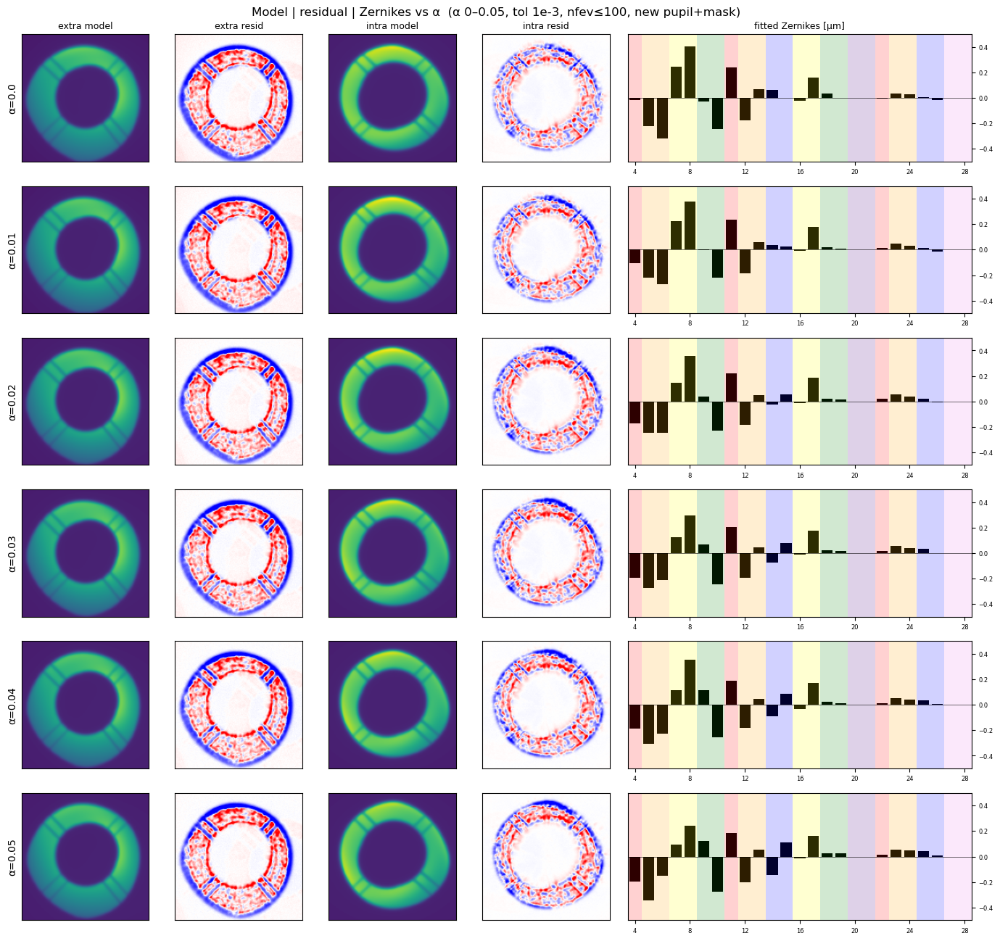

In [25]:
import danish, numpy as np, matplotlib.pyplot as plt
from scipy.optimize import least_squares

LSTSQ = dict(x_scale='jac', ftol=1e-4, xtol=1e-4, gtol=1e-4, max_nfev=100)   # loose tol, more iterations
alphas = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05]

def draw_bars(ax, noll, zk, ylim=0.5):
    ax.bar(noll, zk, color='k')
    for j in [4,11,22]:  ax.axvspan(j-0.5, j+0.5, color='red',    alpha=0.18, ec='none')
    for j in [5,12,23]:  ax.axvspan(j-0.5, j+1.5, color='orange', alpha=0.18, ec='none')
    for j in [7,16]:     ax.axvspan(j-0.5, j+1.5, color='yellow', alpha=0.18, ec='none')
    for j in [9,18]:     ax.axvspan(j-0.5, j+1.5, color='green',  alpha=0.18, ec='none')
    for j in [14,25]:    ax.axvspan(j-0.5, j+1.5, color='blue',   alpha=0.18, ec='none')
    ax.axvspan(19.5,21.5, color='indigo', alpha=0.18, ec='none'); ax.axvspan(26.5,28.5, color='violet', alpha=0.18, ec='none')
    ax.axhline(0, color='k', lw=0.4); ax.set_ylim(-ylim, ylim); ax.set_xlim(3.5, 28.5)
    ax.set_xticks([4,8,12,16,20,24,28]); ax.tick_params(labelsize=6); ax.yaxis.tick_right()

def refit_full(alpha):
    loss_fn = danish.systematic_loss(alpha) if alpha else None
    mkw = {'loss_fn': loss_fn} if loss_fn is not None else {}
    m = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw_new), z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER, **mkw)
    x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                       fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
    bnv = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2, fwhm=[0.1,5.0],
                        bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
    bnv = [list(b) for b in zip(*bnv)]; x0 = np.clip(x0, bnv[0], bnv[1])
    rr = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs, sky), bounds=bnv, **LSTSQ)
    pp = m.unpack_params(rr.x)
    zk = (np.asarray(pp['wavefront_params']) + np.mean([zkS_e, zkS_i], axis=0))*1e6
    mi = m.model(pp['fluxes'], pp['dxs'], pp['dys'], pp['fwhm'], np.asarray(pp['wavefront_params']), bkgs=pp['bkgs'])
    return mi, zk, rr.nfev, float(pp['fwhm'])

def nrm(a): s = np.sum(a); return a/s if s > 0 else a
de, di = nrm(ie), nrm(ii); ve, vi = float(np.nanquantile(de, 0.99)), float(np.nanquantile(di, 0.99))
fig, ax = plt.subplots(len(alphas), 5, figsize=(14, 2.2*len(alphas)),
                       gridspec_kw={'width_ratios': [1, 1, 1, 1, 2.4]})
cols = ['extra model', 'extra resid', 'intra model', 'intra resid', 'fitted Zernikes [µm]']
print(f"{'alpha':>6}{'Z4':>9}{'Z5':>9}{'Z6':>9}{'Z7':>9}{'Z8':>9}{'fwhm':>7}{'nfev':>6}")
for r, a in enumerate(alphas):
    mi, zk, nf, fw = refit_full(a); me, mii = nrm(mi[0]), nrm(mi[1])
    for c, (img, kind, vm) in enumerate([(me,'d',ve), (de-me,'r',ve), (mii,'d',vi), (di-mii,'r',vi)]):
        A = ax[r, c]; A.set_xticks([]); A.set_yticks([])
        A.imshow(img, origin='lower', cmap=('bwr' if kind=='r' else 'viridis'),
                 vmin=(-vm/3 if kind=='r' else -vm/10), vmax=(vm/3 if kind=='r' else vm))
        if r == 0: A.set_title(cols[c], fontsize=9)
    draw_bars(ax[r, 4], noll, zk)
    if r == 0: ax[r, 4].set_title(cols[4], fontsize=9)
    ax[r, 0].set_ylabel(f'α={a}', fontsize=10)
    print(f"{a:6.2f}" + "".join(f"{zk[noll.index(j)]:9.4f}" for j in [4,5,6,7,8]) + f"{fw:7.3f}{nf:6d}")
fig.suptitle('Model | residual | Zernikes vs α  (α 0–0.05, tol 1e-3, nfev≤100, new pupil+mask)')
plt.tight_layout(); plt.show()

# get a sample Donut on R22_S11

In [27]:
# === R22_S11 center-pair discovery v2 (RSP notebook, Danish 1.2) ===
import sys, numpy as np, pandas as pd
from pathlib import Path
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.utils import getTaskInstrument

REPO_ROOT = Path.home() / 'notebooks' / 'rubin-work' / 'aos'
PARAM_SET = 'fam_danish_1_0_wep17_3_0_bin2x'
sys.path.insert(0, str(REPO_ROOT / 'code'))
from intrinsics_lib import load_param_sets

ps   = load_param_sets()[PARAM_SET]
repo = ps.get('butler_repo', '/repo/main')
coll = ps['fam_collections']
print(f'repo={repo}\ncoll={coll}')
butler = Butler(repo, instrument='LSSTCam', collections=coll)
camera = LsstCam.getCamera()
det_id = camera['R22_S11'].getId()
print(f'R22_S11 detector id = {det_id}')

# ---- pick the HIGHEST-|b| clean visit: i-band, elev~70, rotator~0 ----
import astropy.units as u
from astropy.coordinates import SkyCoord
vt = pd.read_parquet(REPO_ROOT / 'output' / PARAM_SET / 'visits.parquet')
b   = SkyCoord(ra=np.asarray(vt['ra'],float)*u.rad, dec=np.asarray(vt['dec'],float)*u.rad).galactic.b.deg
alt = vt['alt'].astype(float).to_numpy(); alt = np.rad2deg(alt) if np.nanmax(np.abs(alt))<7 else alt
rot = vt['rotator_angle'].astype(float).to_numpy()
band = vt['band'].astype(str).to_numpy()
mask = (band=='i') & (np.abs(alt-70)<=2.5) & (np.abs(b)>=25) & (np.abs(rot)<=3)
cand = vt[mask].copy(); cand['gal_b'] = b[mask]
cand = cand.iloc[np.argsort(-np.abs(cand['gal_b'].to_numpy()))]      # highest |b| first
print(f'{len(cand)} clean candidates; |b| range {np.abs(cand["gal_b"]).min():.1f}..{np.abs(cand["gal_b"]).max():.1f}')
day_obs, seq_num = int(cand.iloc[0]['day_obs']), int(cand.iloc[0]['seq_num'])
print(f'using FAM visit day_obs={day_obs} seq_num={seq_num} (b={cand.iloc[0]["gal_b"]:+.1f})')

# ---- center-most used+matched pair on R22_S11 (astropy Table -> numpy) ----
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=day_obs, seq_num=seq_num)
det_str = np.asarray(agg['detector']).astype(str)
used    = np.asarray(agg['used']).astype(bool)
idx = np.where((det_str=='R22_S11') & used)[0]
print(f'\nR22_S11 used donuts: {len(idx)}')
thx = np.asarray(agg['thx_CCS'],float)[idx]; thy = np.asarray(agg['thy_CCS'],float)[idx]
r   = np.hypot(thx, thy)
off = np.hypot(np.asarray(agg['thx_CCS_intra'],float)[idx]-np.asarray(agg['thx_CCS_extra'],float)[idx],
               np.asarray(agg['thy_CCS_intra'],float)[idx]-np.asarray(agg['thy_CCS_extra'],float)[idx])*206265
best = idx[np.argsort(r)[0]]
row = agg[best]
print(f"\ncenter pair (table row {best}): r={np.degrees(np.hypot(row['thx_CCS'],row['thy_CCS'])):.4f} deg")
print(f"  intra/extra field offset = {off[np.argsort(r)[0]]:.2f} arcsec")
print(f"  thx_CCS={np.degrees(row['thx_CCS']):+.4f} thy_CCS={np.degrees(row['thy_CCS']):+.4f} deg")
print(f"  centroid extra=({row['centroid_x_extra']:.1f},{row['centroid_y_extra']:.1f}) "
      f"intra=({row['centroid_x_intra']:.1f},{row['centroid_y_intra']:.1f})")
for k in ('donut_id_extra','donut_id_intra','extra_donut_id','intra_donut_id'):
    print(f"  {k} = {row[k] if k in agg.columns else 'MISSING'}")
print('  has zk_intrinsic_CCS:', 'zk_intrinsic_CCS' in agg.columns)

# ---- which dataset types hold the stamp images for this detector? ----
print('\n--- registry: donut-stamp dataset types for this visit/detector ---')
for dt in sorted(butler.registry.queryDatasetTypes('*onut*tamp*'), key=lambda d: d.name):
    try:
        n = butler.registry.queryDatasets(dt.name, day_obs=day_obs, seq_num=seq_num,
                                          detector=det_id).count()
    except Exception as e:
        n = f'(err {type(e).__name__})'
    print(f'  {dt.name:32s} dims={tuple(dt.dimensions.names)}  found={n}')

# ---- confirm FAM uses the same donutStampsExtra/Intra objects as WFS ----
print('\n--- attempt donutStampsExtra / donutStampsIntra on R22_S11 ---')
for dtype in ('donutStampsExtra', 'donutStampsIntra'):
    try:
        st = butler.get(dtype, day_obs=day_obs, seq_num=seq_num, detector=det_id)
        s0 = st[0]
        print(f'{dtype}: n={len(st)}  type={type(s0).__name__}  '
              f'wep_im.image.shape={np.asarray(s0.wep_im.image).shape}  '
              f'centroid0=({s0.centroid_position.x:.1f},{s0.centroid_position.y:.1f})')
        md = dict(st.metadata) if hasattr(st,'metadata') else {}
        defk = {k:md[k] for k in md if any(t in k.upper() for t in
                ('DEFOCAL','OFFSET','BORESIGHT','ROT','PAR_ANG'))}
        print(f'   defocal/orientation metadata: {defk}')
    except Exception as e:
        print(f'{dtype}: FAILED -> {type(e).__name__}: {e}')

# ---- instrument the fit would use for a science sensor ----
inst = getTaskInstrument('LSSTCam', 'R22_S11', None)
print('\n--- getTaskInstrument("LSSTCam","R22_S11") ---')
for a in ('radius','obscuration','focalLength','pixelSize','defocalOffset'):
    print(f'  inst.{a} = {getattr(inst, a, "MISSING")}')
print(f"  maskParams M1 outer[-1]={inst.maskParams['M1']['outer']['radius'][-1]:.4f} "
      f"inner[-1]={inst.maskParams['M1']['inner']['radius'][-1]:.4f}")

repo=/repo/main
coll=['LSSTCam/runs/aos/fam/danish_1_0/wep_17_3_0/dv_4_2_0/bin_x2/paired']


R22_S11 detector id = 94
79 clean candidates; |b| range 25.2..52.7
using FAM visit day_obs=20260419 seq_num=273 (b=+52.7)



R22_S11 used donuts: 11

center pair (table row 1697): r=0.0399 deg
  intra/extra field offset = 1.08 arcsec
  thx_CCS=+0.0303 thy_CCS=+0.0260 deg
  centroid extra=(2512.7,2546.0) intra=(2517.7,2548.0)
  donut_id_extra = 2026041900273_094_013
  donut_id_intra = 2026041900272_094_013
  extra_donut_id = 2026041900273_094_013
  intra_donut_id = 2026041900272_094_013
  has zk_intrinsic_CCS: True

--- registry: donut-stamp dataset types for this visit/detector ---
  aggregateDonutStampsTask_config  dims=()  found=(err KeyError)
  aggregateDonutStampsTask_log     dims=('band', 'instrument', 'day_obs', 'physical_filter', 'visit')  found=(err KeyError)
  aggregateDonutStampsTask_metadata dims=('band', 'instrument', 'day_obs', 'physical_filter', 'visit')  found=(err KeyError)
  aggregateDonutStampsUnpairedTask_config dims=()  found=(err KeyError)
  aggregateDonutStampsUnpairedTask_log dims=('band', 'instrument', 'day_obs', 'physical_filter', 'visit')  found=(err KeyError)
  aggregateDonutStamp

donutStampsExtra: n=34  type=DonutStamp  wep_im.image.shape=(200, 200)  centroid0=(2867.0,1830.0)
   defocal/orientation metadata: {'BORESIGHT_ROT_ANGLE_RAD': 1.57027670662976, 'BORESIGHT_PAR_ANGLE_RAD': 3.12612540605957, 'BORESIGHT_ALT_RAD': 1.22258109883183, 'BORESIGHT_AZ_RAD': 6.2702215260454, 'BORESIGHT_RA_RAD': 3.39419793795798, 'BORESIGHT_DEC_RAD': -0.176193717803214}


donutStampsIntra: n=35  type=DonutStamp  wep_im.image.shape=(200, 200)  centroid0=(2872.0,1830.0)
   defocal/orientation metadata: {'BORESIGHT_ROT_ANGLE_RAD': 1.57027390700386, 'BORESIGHT_PAR_ANGLE_RAD': 3.13460413468401, 'BORESIGHT_ALT_RAD': 1.22260615310226, 'BORESIGHT_AZ_RAD': 6.2799467452851, 'BORESIGHT_RA_RAD': 3.39419778101925, 'BORESIGHT_DEC_RAD': -0.176193768203698}

--- getTaskInstrument("LSSTCam","R22_S11") ---
  inst.radius = 4.18
  inst.obscuration = 0.612
  inst.focalLength = 10.312
  inst.pixelSize = 1e-05
  inst.defocalOffset = 0.0015
  maskParams M1 outer[-1]=4.1800 inner[-1]=2.5580


top rotator~0 candidates (day_obs, seq_num, b, rot):
   20260317  235  b=+20.2  rot=-0.06
   20260315  263  b=+20.1  rot=-0.06
   20260316  737  b=+27.9  rot=+0.14
   20260316  740  b=+27.6  rot=+0.14
   20260316  743  b=+27.4  rot=+0.14

using FAM visit day_obs=20260317 seq_num=235


R22_S11 used donuts: 15; showing nearest 8


#0: agg_row=1765 r=0.0194d snr(e/i)=31334/31119 flux(e/i)=1.65e+07/1.66e+07 blend(e/i)=0/0 don_id=2026031700235_094_015
#1: agg_row=1754 r=0.0454d snr(e/i)=56165/54530 flux(e/i)=1.35e+08/1.35e+08 blend(e/i)=0/0 don_id=2026031700235_094_004
#2: agg_row=1756 r=0.0631d snr(e/i)=48059/47065 flux(e/i)=5.33e+07/5.34e+07 blend(e/i)=0/0 don_id=2026031700235_094_006
#3: agg_row=1758 r=0.0678d snr(e/i)=46739/45808 flux(e/i)=4.77e+07/4.77e+07 blend(e/i)=0/0 don_id=2026031700235_094_008
#4: agg_row=1753 r=0.0706d snr(e/i)=58366/56728 flux(e/i)=2.04e+08/2.04e+08 blend(e/i)=0/0 don_id=2026031700235_094_003
#5: agg_row=1763 r=0.0805d snr(e/i)=33711/33376 flux(e/i)=1.89e+07/1.90e+07 blend(e/i)=0/0 don_id=2026031700235_094_013
#6: agg_row=1757 r=0.0814d snr(e/i)=46740/45815 flux(e/i)=4.84e+07/4.85e+07 blend(e/i)=0/0 don_id=2026031700235_094_007
#7: agg_row=1755 r=0.0847d snr(e/i)=49209/48230 flux(e/i)=5.82e+07/5.83e+07 blend(e/i)=0/0 don_id=2026031700235_094_005


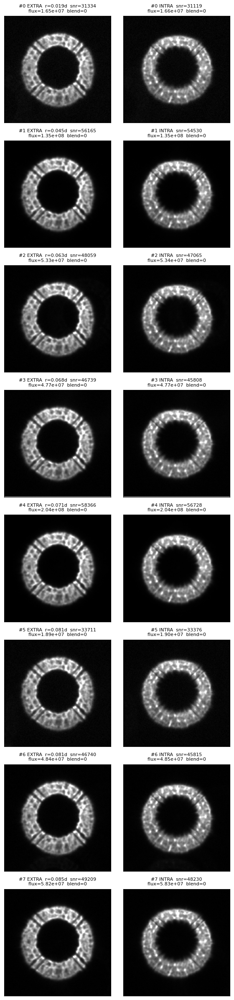

In [28]:
# === R22_S11 center-donut gallery (RSP notebook, Danish 1.2) — pick a clean pair ===
import sys, numpy as np, pandas as pd
from pathlib import Path
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
import matplotlib.pyplot as plt

# ---- CONFIG ----
PARAM_SET = 'fam_danish_1_0_wep17_3_0_bin2x'
B_MIN     = 20.0          # relaxed; rotator~0 is the priority
N_SHOW    = 8             # how many nearest-center donuts to display
DAY_OBS, SEQ_NUM = None, None     # set to override the auto visit pick

REPO_ROOT = Path.home() / 'notebooks' / 'rubin-work' / 'aos'
sys.path.insert(0, str(REPO_ROOT / 'code'))
from intrinsics_lib import load_param_sets
ps = load_param_sets()[PARAM_SET]
butler = Butler(ps.get('butler_repo','/repo/main'), instrument='LSSTCam',
                collections=ps['fam_collections'])
camera = LsstCam.getCamera(); det_id = camera['R22_S11'].getId()

# ---- pick rotator~0 visit (closest to 0), |b|>=B_MIN, i-band, elev~70 ----
if DAY_OBS is None:
    import astropy.units as u
    from astropy.coordinates import SkyCoord
    vt = pd.read_parquet(REPO_ROOT / 'output' / PARAM_SET / 'visits.parquet')
    bb  = SkyCoord(ra=np.asarray(vt['ra'],float)*u.rad, dec=np.asarray(vt['dec'],float)*u.rad).galactic.b.deg
    alt = vt['alt'].astype(float).to_numpy(); alt = np.rad2deg(alt) if np.nanmax(np.abs(alt))<7 else alt
    rot = vt['rotator_angle'].astype(float).to_numpy(); band = vt['band'].astype(str).to_numpy()
    mask = (band=='i') & (np.abs(alt-70)<=2.5) & (np.abs(bb)>=B_MIN) & (np.abs(rot)<=3)
    cand = vt[mask].copy(); cand['gal_b'] = bb[mask]; cand['rot'] = rot[mask]
    cand = cand.iloc[np.argsort(np.abs(cand['rot'].to_numpy()))]      # closest to rot 0 first
    print('top rotator~0 candidates (day_obs, seq_num, b, rot):')
    for _,c in cand.head(5).iterrows():
        print(f"   {int(c['day_obs'])} {int(c['seq_num']):4d}  b={c['gal_b']:+5.1f}  rot={c['rot']:+5.2f}")
    DAY_OBS, SEQ_NUM = int(cand.iloc[0]['day_obs']), int(cand.iloc[0]['seq_num'])
print(f'\nusing FAM visit day_obs={DAY_OBS} seq_num={SEQ_NUM}')

# ---- used donuts on R22_S11, nearest center first ----
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY_OBS, seq_num=SEQ_NUM)
det_str = np.asarray(agg['detector']).astype(str); used = np.asarray(agg['used']).astype(bool)
idx = np.where((det_str=='R22_S11') & used)[0]
r = np.hypot(np.asarray(agg['thx_CCS'],float)[idx], np.asarray(agg['thy_CCS'],float)[idx])
idx = idx[np.argsort(r)]                                            # center-most first
print(f'R22_S11 used donuts: {len(idx)}; showing nearest {min(N_SHOW,len(idx))}')

es = butler.get('donutStampsExtra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
is_= butler.get('donutStampsIntra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])

def n_blend(s):
    bp = getattr(s, 'blend_centroid_positions', None)
    if bp is None: return -1
    bp = np.atleast_2d(np.asarray(bp, float))
    return 0 if bp.size==0 else int(np.isfinite(bp).all(axis=1).sum())

def show(ax, s, title):
    img = np.asarray(s.wep_im.image)
    lo, hi = np.percentile(img, [1, 99.5])
    ax.imshow(img, origin='lower', cmap='gray', vmin=lo, vmax=hi)
    ax.set_title(title, fontsize=8); ax.set_xticks([]); ax.set_yticks([])

n = min(N_SHOW, len(idx))
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n)); axes = np.atleast_2d(axes)
for j, i0 in enumerate(idx[:n]):
    row = agg[i0]
    ek = int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))
    ik = int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))
    rd = np.degrees(np.hypot(row['thx_CCS'], row['thy_CCS']))
    fe, fi = float(np.sum(np.asarray(es[ek].wep_im.image))), float(np.sum(np.asarray(is_[ik].wep_im.image)))
    show(axes[j,0], es[ek], f"#{j} EXTRA  r={rd:.3f}d  snr={row['snr_extra']:.0f}\n"
                            f"flux={fe:.2e}  blend={n_blend(es[ek])}")
    show(axes[j,1], is_[ik], f"#{j} INTRA  snr={row['snr_intra']:.0f}\n"
                             f"flux={fi:.2e}  blend={n_blend(is_[ik])}")
    print(f"#{j}: agg_row={i0} r={rd:.4f}d snr(e/i)={row['snr_extra']:.0f}/{row['snr_intra']:.0f} "
          f"flux(e/i)={fe:.2e}/{fi:.2e} blend(e/i)={n_blend(es[ek])}/{n_blend(is_[ik])} "
          f"don_id={row['donut_id_extra']}")
plt.tight_layout(); plt.show()

top near-focus rot~0 candidates (day_obs, seq, b, rot, z4_c1[um]):
   20260419  279  b=+52.7  rot=-0.75  z4_c1=-0.001
   20260325  234  b=+32.2  rot=-0.86  z4_c1=-0.001
   20260316  737  b=+27.9  rot=+0.14  z4_c1=+0.003
   20260420   68  b=+34.0  rot=-0.61  z4_c1=-0.007
   20260316  743  b=+27.4  rot=+0.14  z4_c1=-0.009
   20260418  380  b=-27.6  rot=+0.17  z4_c1=+0.020

using FAM visit day_obs=20260419 seq_num=279  DZ k=1,j=4 defocus z4_c1=-0.001 um  (near 0 => in focus)


R22_S11 used donuts: 11; showing nearest 8


#0: agg_row=1743 r=0.0281d snr(e/i)=10462/10802 flux(e/i)=4.59e+06/4.47e+06 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_008
#1: agg_row=1745 r=0.0308d snr(e/i)=8279/8544 flux(e/i)=3.42e+06/3.35e+06 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_010
#2: agg_row=1738 r=0.0562d snr(e/i)=21355/21736 flux(e/i)=1.16e+07/1.13e+07 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_003
#3: agg_row=1749 r=0.0640d snr(e/i)=2986/3145 flux(e/i)=1.09e+06/1.08e+06 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_014
#4: agg_row=1744 r=0.0657d snr(e/i)=8802/9117 flux(e/i)=3.67e+06/3.59e+06 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_009
#5: agg_row=1736 r=0.0897d snr(e/i)=48702/47317 flux(e/i)=6.99e+07/6.83e+07 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_001
#6: agg_row=1742 r=0.0980d snr(e/i)=11466/11788 flux(e/i)=5.11e+06/4.98e+06 blend(e/i)=0/0 z4_c1=-0.001 don_id=2026041900279_094_007
#7: agg_row=1735 r=0.1015d snr(e/i)=58019/55507 flux(e/i)=1.88e+08/1.84e+08

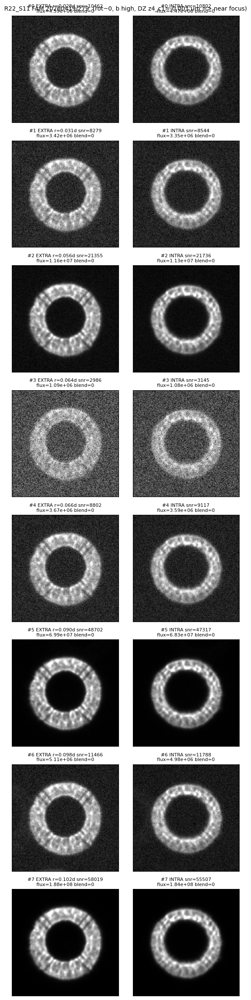

In [30]:
# === R22_S11 center-donut gallery v4 — rot~0, near-focus (DZ z4_c1~0), pick a clean pair ===
import sys, numpy as np, pandas as pd
from pathlib import Path
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
import matplotlib.pyplot as plt

# ---- CONFIG ----
PARAM_SET = 'fam_danish_1_0_wep17_3_0_bin2x'
B_MIN     = 20.0          # rotator~0 + near-focus are the priorities; b relaxed
N_SHOW    = 8
DAY_OBS, SEQ_NUM = None, None     # set to override the auto visit pick

REPO_ROOT = Path.home() / 'notebooks' / 'rubin-work' / 'aos'
base = REPO_ROOT / 'output' / PARAM_SET
sys.path.insert(0, str(REPO_ROOT / 'code'))
from intrinsics_lib import load_param_sets
ps = load_param_sets()[PARAM_SET]
butler = Butler(ps.get('butler_repo','/repo/main'), instrument='LSSTCam',
                collections=ps['fam_collections'])
camera = LsstCam.getCamera(); det_id = camera['R22_S11'].getId()

# ---- pick rot~0, high-b, NEAR-FOCUS visit (smallest |z1toz6_z4_c1|) ----
if DAY_OBS is None:
    import astropy.units as u
    from astropy.coordinates import SkyCoord
    vt = pd.read_parquet(base / 'visits.parquet')
    bb  = SkyCoord(ra=np.asarray(vt['ra'],float)*u.rad, dec=np.asarray(vt['dec'],float)*u.rad).galactic.b.deg
    alt = vt['alt'].astype(float).to_numpy(); alt = np.rad2deg(alt) if np.nanmax(np.abs(alt))<7 else alt
    rot = vt['rotator_angle'].astype(float).to_numpy(); band = vt['band'].astype(str).to_numpy()
    mask = (band=='i') & (np.abs(alt-70)<=2.5) & (np.abs(bb)>=B_MIN) & (np.abs(rot)<=3)
    cand = vt[mask][['day_obs','seq_num']].copy(); cand['gal_b'] = bb[mask]; cand['rot'] = rot[mask]
    fits = pd.read_parquet(base / 'fits.parquet', columns=['day_obs','seq_num','z1toz6_z4_c1'])
    cand = cand.merge(fits, on=['day_obs','seq_num'], how='left')
    cand = cand.iloc[np.argsort(cand['z1toz6_z4_c1'].abs().to_numpy())]   # most in-focus first
    print('top near-focus rot~0 candidates (day_obs, seq, b, rot, z4_c1[um]):')
    for _,c in cand.head(6).iterrows():
        print(f"   {int(c['day_obs'])} {int(c['seq_num']):4d}  b={c['gal_b']:+5.1f}  "
              f"rot={c['rot']:+5.2f}  z4_c1={c['z1toz6_z4_c1']:+.3f}")
    DAY_OBS, SEQ_NUM = int(cand.iloc[0]['day_obs']), int(cand.iloc[0]['seq_num'])
    Z4_C1 = float(cand.iloc[0]['z1toz6_z4_c1'])
else:
    fits = pd.read_parquet(base / 'fits.parquet', columns=['day_obs','seq_num','z1toz6_z4_c1'])
    m = fits[(fits.day_obs==DAY_OBS)&(fits.seq_num==SEQ_NUM)]
    Z4_C1 = float(m['z1toz6_z4_c1'].iloc[0]) if len(m) else np.nan
print(f'\nusing FAM visit day_obs={DAY_OBS} seq_num={SEQ_NUM}  '
      f'DZ k=1,j=4 defocus z4_c1={Z4_C1:+.3f} um  (near 0 => in focus)')

# ---- used donuts on R22_S11, nearest center first ----
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY_OBS, seq_num=SEQ_NUM)
det_str = np.asarray(agg['detector']).astype(str); used = np.asarray(agg['used']).astype(bool)
idx = np.where((det_str=='R22_S11') & used)[0]
r = np.hypot(np.asarray(agg['thx_CCS'],float)[idx], np.asarray(agg['thy_CCS'],float)[idx])
idx = idx[np.argsort(r)]
print(f'R22_S11 used donuts: {len(idx)}; showing nearest {min(N_SHOW,len(idx))}')

es = butler.get('donutStampsExtra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
is_= butler.get('donutStampsIntra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])

def n_blend(s):
    bp = getattr(s, 'blend_centroid_positions', None)
    if bp is None: return -1
    bp = np.atleast_2d(np.asarray(bp, float))
    return 0 if bp.size==0 else int(np.isfinite(bp).all(axis=1).sum())

def show(ax, s, title):
    img = np.asarray(s.wep_im.image); lo, hi = np.percentile(img, [1, 99.5])
    ax.imshow(img, origin='lower', cmap='gray', vmin=lo, vmax=hi)
    ax.set_title(title, fontsize=8); ax.set_xticks([]); ax.set_yticks([])

n = min(N_SHOW, len(idx))
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n)); axes = np.atleast_2d(axes)
for j, i0 in enumerate(idx[:n]):
    row = agg[i0]
    ek = int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))
    ik = int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))
    rd = np.degrees(np.hypot(row['thx_CCS'], row['thy_CCS']))
    fe, fi = float(np.sum(np.asarray(es[ek].wep_im.image))), float(np.sum(np.asarray(is_[ik].wep_im.image)))
    show(axes[j,0], es[ek], f"#{j} EXTRA r={rd:.3f}d snr={row['snr_extra']:.0f}\n"
                            f"flux={fe:.2e} blend={n_blend(es[ek])}")
    show(axes[j,1], is_[ik], f"#{j} INTRA snr={row['snr_intra']:.0f}\n"
                             f"flux={fi:.2e} blend={n_blend(is_[ik])}")
    print(f"#{j}: agg_row={i0} r={rd:.4f}d snr(e/i)={row['snr_extra']:.0f}/{row['snr_intra']:.0f} "
          f"flux(e/i)={fe:.2e}/{fi:.2e} blend(e/i)={n_blend(es[ek])}/{n_blend(is_[ik])} "
          f"z4_c1={Z4_C1:+.3f} don_id={row['donut_id_extra']}")
fig.suptitle(f'R22_S11 FAM {DAY_OBS}/{SEQ_NUM}  (rot~0, b high, DZ z4_c1={Z4_C1:+.3f} um => near focus)',
             fontsize=10)
plt.tight_layout(); plt.show()

visit 20260419/279  donut #5  id=2026041900279_094_001  r=0.0897deg  z4_c1=-0.001um  rtp=-0.84deg


/tmp/ipykernel_175/628887522.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


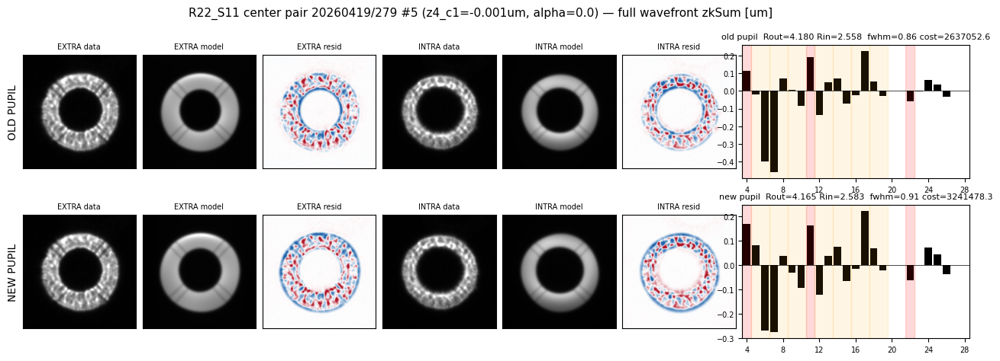


  Z  old_zkSum  new_zkSum  Δ(new-old)   old_dev   new_dev
  4      0.114      0.168       0.054     0.015     0.069
  5     -0.018      0.082       0.100    -0.017     0.083
  6     -0.397     -0.270       0.127    -0.391    -0.264
  7     -0.460     -0.276       0.184    -0.473    -0.290
  8      0.071      0.037      -0.035     0.076     0.041
  9      0.007     -0.031      -0.038     0.011    -0.027
 10     -0.086     -0.094      -0.008    -0.085    -0.092
 11      0.189      0.162      -0.027     0.143     0.116

fit cost: old=2637052.65  new=3241478.32  (lower=better); success old=True new=True


In [31]:
# === R22_S11 center pair: OLD vs NEW pupil Danish-1.2 fit (RSP notebook, Danish 1.2) ===
import sys, numpy as np, pandas as pd
from pathlib import Path
from scipy.optimize import least_squares
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument
import danish, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# ---- CONFIG ----
PARAM_SET    = 'fam_danish_1_0_wep17_3_0_bin2x'
B_MIN        = 20.0
DONUT_INDEX  = 5            # the #index you picked from the gallery
ALPHA        = 0.0          # systematic_loss alpha (0 = baseline; study pupil cleanly)

REPO_ROOT = Path.home() / 'notebooks' / 'rubin-work' / 'aos'
base = REPO_ROOT / 'output' / PARAM_SET
sys.path.insert(0, str(REPO_ROOT / 'code'))
from intrinsics_lib import load_param_sets
from run_wfs_refit_ensemble import build_factory_kwargs, LSTSQ, BKG_ORDER, BINNING  # same recipe

ps = load_param_sets()[PARAM_SET]
butler = Butler(ps.get('butler_repo','/repo/main'), instrument='LSSTCam', collections=ps['fam_collections'])
camera = LsstCam.getCamera(); det_id = camera['R22_S11'].getId()
inst = getTaskInstrument('LSSTCam', 'R22_S11', None); algo = DanishAlgorithm()

# ---- reproduce the gallery's visit + donut selection ----
import astropy.units as u
from astropy.coordinates import SkyCoord
vt = pd.read_parquet(base / 'visits.parquet')
bb  = SkyCoord(ra=np.asarray(vt['ra'],float)*u.rad, dec=np.asarray(vt['dec'],float)*u.rad).galactic.b.deg
alt = vt['alt'].astype(float).to_numpy(); alt = np.rad2deg(alt) if np.nanmax(np.abs(alt))<7 else alt
rot = vt['rotator_angle'].astype(float).to_numpy(); band = vt['band'].astype(str).to_numpy()
mask = (band=='i') & (np.abs(alt-70)<=2.5) & (np.abs(bb)>=B_MIN) & (np.abs(rot)<=3)
cand = vt[mask][['day_obs','seq_num']].copy(); cand['rot'] = rot[mask]
fits = pd.read_parquet(base / 'fits.parquet', columns=['day_obs','seq_num','z1toz6_z4_c1'])
cand = cand.merge(fits, on=['day_obs','seq_num'], how='left')
cand = cand.iloc[np.argsort(cand['z1toz6_z4_c1'].abs().to_numpy())]
DAY_OBS, SEQ_NUM = int(cand.iloc[0]['day_obs']), int(cand.iloc[0]['seq_num'])
Z4_C1 = float(cand.iloc[0]['z1toz6_z4_c1'])

agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY_OBS, seq_num=SEQ_NUM)
det_str = np.asarray(agg['detector']).astype(str); used = np.asarray(agg['used']).astype(bool)
idx = np.where((det_str=='R22_S11') & used)[0]
r = np.hypot(np.asarray(agg['thx_CCS'],float)[idx], np.asarray(agg['thy_CCS'],float)[idx])
idx = idx[np.argsort(r)]
i0 = idx[DONUT_INDEX]; row = agg[i0]
noll = [int(x) for x in agg.meta['nollIndices']]

es = butler.get('donutStampsExtra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
is_= butler.get('donutStampsIntra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
exy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x, s.centroid_position.y] for s in is_])
ek = int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))
ik = int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))
ex, inn = es[ek], is_[ik]
rtp_deg = np.rad2deg(es.metadata['BORESIGHT_PAR_ANGLE_RAD']
                     - es.metadata['BORESIGHT_ROT_ANGLE_RAD'] - np.pi/2)
print(f'visit {DAY_OBS}/{SEQ_NUM}  donut #{DONUT_INDEX}  id={row["donut_id_extra"]}  '
      f'r={np.degrees(np.hypot(row["thx_CCS"],row["thy_CCS"])):.4f}deg  z4_c1={Z4_C1:+.3f}um  rtp={rtp_deg:.2f}deg')

# ---- fit one pupil, return data/model/residual + zernikes ----
def fit_pupil(pupil):
    fkw = build_factory_kwargs(inst, rtp_deg, pupil=pupil)
    zk_int = np.asarray(row['zk_intrinsic_CCS']) * 1e-6
    zkS_e = zk_int.copy(); zkS_i = zk_int.copy()           # CCD-height Z4 = 0 (isolate pupil)
    ie,ae,ze,bge = algo._prepDanish(image=ex.wep_im,  zkStart=zkS_e, nollIndices=noll, instrument=inst)
    ii,ai,zi,bgi = algo._prepDanish(image=inn.wep_im, zkStart=zkS_i, nollIndices=noll, instrument=inst)
    imgs, sky, zkRefs = [ie,ii], [bge**2,bgi**2], [ze,zi]
    dz_terms = [(1,j) for j in noll]
    loss_fn = danish.systematic_loss(ALPHA) if ALPHA else None
    mkw = {'loss_fn': loss_fn} if loss_fn is not None else {}
    m = danish.DZMultiDonutModel(danish.DonutTriangleFactory(**fkw), z_refs=zkRefs, dz_terms=dz_terms,
            field_radius=np.deg2rad(1.81), thxs=[ae[0],ai[0]], thys=[ae[1],ai[1]],
            npix=ie.shape[0], bkg_order=BKG_ORDER, **mkw)
    x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
            fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
    bn = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2,
            fwhm=[0.1,5.0], bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
    bn = [list(b) for b in zip(*bn)]; x0 = np.clip(x0, bn[0], bn[1])
    res = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs,sky), bounds=bn, **LSTSQ)
    p = m.unpack_params(res.x)
    mdl = m.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], p['wavefront_params'],
                  bkgs=[tuple(b) for b in p['bkgs']])
    dev   = np.asarray(p['wavefront_params']) * 1e6                          # fitted deviation [um]
    zkSum = (np.asarray(p['wavefront_params']) + np.mean([zkS_e,zkS_i],0)) * 1e6   # full wavefront [um]
    return dict(data=imgs, mdl=mdl, dev=dev, zkSum=zkSum, fwhm=float(p['fwhm']),
                cost=float(res.cost), ok=bool(res.success),
                Router=fkw['R_outer'], Rinner=fkw['R_inner'])

R = {pup: fit_pupil(pup) for pup in ('old','new')}

# ---- display: data|model|resid (extra & intra) + zernike bars, per pupil ----
DV = LinearSegmentedColormap.from_list('bwr2', ['#2166ac','white','#b2182b'])
def panel(ax, img, vlo, vhi, cmap, t):
    ax.imshow(img, origin='lower', cmap=cmap, vmin=vlo, vmax=vhi)
    ax.set_title(t, fontsize=7); ax.set_xticks([]); ax.set_yticks([])

fig, axes = plt.subplots(2, 7, figsize=(16, 5),
                         gridspec_kw={'width_ratios':[1,1,1,1,1,1,2.0], 'wspace':0.05, 'hspace':0.2})
for rr, pup in enumerate(('old','new')):
    d = R[pup]; (de,di) = d['data']; (me,mi) = d['mdl']
    for c,(dat,mod,lab) in enumerate([(de,me,'EXTRA'),(di,mi,'INTRA')]):
        vlo,vhi = np.percentile(dat,[1,99.5]); res = dat-mod
        vr = np.percentile(np.abs(res),99) + 1e-9
        panel(axes[rr,3*c+0], dat, vlo,vhi,'gray', f'{lab} data')
        panel(axes[rr,3*c+1], mod, vlo,vhi,'gray', f'{lab} model')
        panel(axes[rr,3*c+2], res, -vr,vr, DV,    f'{lab} resid')
    axb = axes[rr,6]
    axb.bar(noll, d['zkSum'], color='k'); axb.axhline(0,color='k',lw=0.5)
    for j in [4,11,22]: axb.axvspan(j-.5,j+.5,color='red',alpha=.15)
    for j in [5,7,9,12,14,16,18]: axb.axvspan(j-.5,j+1.5,color='orange',alpha=.10)
    axb.set_xlim(3.5,28.5); axb.set_xticks([4,8,12,16,20,24,28]); axb.tick_params(labelsize=7)
    axb.set_title(f'{pup} pupil  Rout={d["Router"]:.3f} Rin={d["Rinner"]:.3f}  '
                  f'fwhm={d["fwhm"]:.2f} cost={d["cost"]:.1f}', fontsize=8)
    axes[rr,0].set_ylabel(f'{pup.upper()} PUPIL', fontsize=10)
fig.suptitle(f'R22_S11 center pair {DAY_OBS}/{SEQ_NUM} #{DONUT_INDEX} '
             f'(z4_c1={Z4_C1:+.3f}um, alpha={ALPHA}) — full wavefront zkSum [um]', fontsize=11)
plt.tight_layout(); plt.show()

# ---- numeric comparison ----
print(f"\n{'Z':>3} {'old_zkSum':>10} {'new_zkSum':>10} {'Δ(new-old)':>11} "
      f"{'old_dev':>9} {'new_dev':>9}")
for k,j in enumerate(noll):
    if j > 11: break
    print(f"{j:>3} {R['old']['zkSum'][k]:>10.3f} {R['new']['zkSum'][k]:>10.3f} "
          f"{R['new']['zkSum'][k]-R['old']['zkSum'][k]:>11.3f} "
          f"{R['old']['dev'][k]:>9.3f} {R['new']['dev'][k]:>9.3f}")
print(f"\nfit cost: old={R['old']['cost']:.2f}  new={R['new']['cost']:.2f}  "
      f"(lower=better); success old={R['old']['ok']} new={R['new']['ok']}")

In [32]:
import copy
print('old M1 outer/inner[-1]:', inst.maskParams['M1']['outer']['radius'][-1],
                                  inst.maskParams['M1']['inner']['radius'][-1])
mpn = copy.deepcopy(inst.maskParams)
mpn['M1']['outer']['radius'][-1] = 4.165; mpn['M1']['inner']['radius'][-1] = 2.5833
print('new M1 outer/inner[-1]:', mpn['M1']['outer']['radius'][-1], mpn['M1']['inner']['radius'][-1])

old M1 outer/inner[-1]: 4.18 2.558
new M1 outer/inner[-1]: 4.165 2.5833


In [33]:
import copy
R_OUTER, R_INNER = 4.165, 2.5833
mpn = copy.deepcopy(inst.maskParams)
mpn['M1']['outer']['radius'][-1] = R_OUTER
mpn['M1']['inner']['radius'][-1] = R_INNER
print('--- NEW pupil case (factory overrides; inst untouched) ---')
print(f'  factory R_outer = {R_OUTER}')
print(f'  factory R_inner = {R_INNER}')
print(f'  maskParams M1 outer[-1]={mpn["M1"]["outer"]["radius"][-1]:.4f} '
      f'inner[-1]={mpn["M1"]["inner"]["radius"][-1]:.4f}')
print(f'  (unchanged on inst: radius={inst.radius}, obscuration={inst.obscuration}, '
      f'focalLength={inst.focalLength}, pixelSize={inst.pixelSize}, defocalOffset={inst.defocalOffset})')

--- NEW pupil case (factory overrides; inst untouched) ---
  factory R_outer = 4.165
  factory R_inner = 2.5833
  maskParams M1 outer[-1]=4.1650 inner[-1]=2.5833
  (unchanged on inst: radius=4.18, obscuration=0.612, focalLength=10.312, pixelSize=1e-05, defocalOffset=0.0015)


In [34]:
zk_int = np.asarray(row['zk_intrinsic_CCS']) * 1e-6
ie,ae,ze,_ = algo._prepDanish(image=ex.wep_im,  zkStart=zk_int, nollIndices=noll, instrument=inst)
ii,ai,zi,_ = algo._prepDanish(image=inn.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
i4 = noll.index(4)
print(f'reference Z4 (defocus) from _prepDanish, ±{inst.defocalOffset*1e3:.1f} mm offset:')
print(f'  extra ze[Z4] = {ze[i4]*1e6:+.2f} um   intra zi[Z4] = {zi[i4]*1e6:+.2f} um')
print(f'  ze-zi        = {(ze[i4]-zi[i4])*1e6:+.2f} um   (the 2x defocal Z4 split)')

reference Z4 (defocus) from _prepDanish, ±1.5 mm offset:
  extra ze[Z4] = -0.00 um   intra zi[Z4] = -0.00 um
  ze-zi        = +0.00 um   (the 2x defocal Z4 split)


In [35]:
import inspect, numpy as np
from lsst.ts.wep.utils import DefocalType
for n in ('getIntrinsicZernikes','getIntrinsicZernikesTA','getOffAxisCoeff'):
    print(n, inspect.signature(getattr(inst, n)))

thx_d, thy_d = np.degrees(row['thx_CCS']), np.degrees(row['thy_CCS']); jmax = 28
gq   = inst._getIntrinsicZernikesCached  (thx_d, thy_d, None,              'i', jmax)*1e6  # GQ µm
ta_e = inst._getIntrinsicZernikesTACached(thx_d, thy_d, DefocalType.Extra, 'i', jmax)*1e6  # TA +def
ta_i = inst._getIntrinsicZernikesTACached(thx_d, thy_d, DefocalType.Intra, 'i', jmax)*1e6  # TA -def
print(f"\n{'Z':>3} {'GQ_intr':>9} {'TA_extra':>9} {'TA_intra':>9} {'TAe-GQ':>9} {'TAi-GQ':>9}")
for j in range(4, 12):
    print(f"{j:>3} {gq[j]:>9.3f} {ta_e[j]:>9.3f} {ta_i[j]:>9.3f} {ta_e[j]-gq[j]:>9.3f} {ta_i[j]-gq[j]:>9.3f}")

getIntrinsicZernikes (xAngle: 'float', yAngle: 'float', defocalType: 'DefocalType | None' = None, band: 'BandLabel | str' = <BandLabel.REF: 'ref'>, nollIndices: 'Sequence[int]' = (np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(55), np.int64(56), np.int64(57), np.int64(58), np.int64(59), np.int64(60), np.int64(61), np.int64(62), 

AttributeError: 'Instrument' object has no attribute 'getIntrinsicZernikesTA'

In [36]:
import numpy as np
meths = [m for m in dir(inst) if any(k in m for k in
         ('ntrinsic','ffAxis','ffaxis','ernike','TA','Batoid','batoid'))]
print('\n'.join(meths))

_batoidModelName
_batoidOffsetOptic
_batoidOffsetValue
_defocalOffsetBatoid
_focalLengthBatoid
_getIntrinsicZernikesCached
_getIntrinsicZernikesTACached
batoidModelName
batoidOffsetOptic
batoidOffsetValue
createZernikeBasis
createZernikeGradBasis
getBatoidModel
getIntrinsicZernikes
getOffAxisCoeff


In [37]:
import inspect, numpy as np
from lsst.ts.wep.utils import DefocalType
for n in ('getIntrinsicZernikes','getOffAxisCoeff',
          '_getIntrinsicZernikesCached','_getIntrinsicZernikesTACached'):
    print(n, inspect.signature(getattr(inst, n)))

thx_d, thy_d = np.degrees(row['thx_CCS']), np.degrees(row['thy_CCS']); jmax = 28
gq   = inst._getIntrinsicZernikesCached  (thx_d, thy_d, None,              'i', jmax)*1e6  # GQ, no defocus
ta_e = inst._getIntrinsicZernikesTACached(thx_d, thy_d, DefocalType.Extra, 'i', jmax)*1e6  # TA, +defocus
ta_i = inst._getIntrinsicZernikesTACached(thx_d, thy_d, DefocalType.Intra, 'i', jmax)*1e6  # TA, -defocus
print(f"\n{'Z':>3} {'GQ_intr':>9} {'TA_extra':>9} {'TA_intra':>9} {'TAe-GQ':>9} {'TAi-GQ':>9}")
for j in range(4, 12):
    print(f"{j:>3} {gq[j]:>9.3f} {ta_e[j]:>9.3f} {ta_i[j]:>9.3f} {ta_e[j]-gq[j]:>9.3f} {ta_i[j]-gq[j]:>9.3f}")

getIntrinsicZernikes (xAngle: 'float', yAngle: 'float', defocalType: 'DefocalType | None' = None, band: 'BandLabel | str' = <BandLabel.REF: 'ref'>, nollIndices: 'Sequence[int]' = (np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(55), np.int64(56), np.int64(57), np.int64(58), np.int64(59), np.int64(60), np.int64(61), np.int64(62), 

In [38]:
i = best  # the agg row index you fit
zk  = np.asarray(agg['zk_CCS'][i], float)
zki = np.asarray(agg['zk_intrinsic_CCS'][i], float)
zkd = np.asarray(agg['zk_deviation_CCS'][i], float)
print('max|zk - zk_intrinsic - zk_deviation| =', np.max(np.abs(zk - zki - zkd)))   # ~0 => full = intrinsic + deviation
# and inspect the source-of-truth column metadata:
zt = butler.get('zernikes', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=94)
print(zt.meta.get('opd_columns'), zt.meta.get('intrinsic_columns'), zt.meta.get('deviation_columns'))

In [39]:
# === R22_S11 center pair: OUTER/INNER radius grid scan (RSP notebook, Danish 1.2) ===
import sys, copy, numpy as np, pandas as pd
from pathlib import Path
from scipy.optimize import least_squares
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument
import danish, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

PARAM_SET, B_MIN, DONUT_INDEX, ALPHA = 'fam_danish_1_0_wep17_3_0_bin2x', 20.0, 5, 0.0
DOUT = np.array([-0.015, -0.010, -0.005, 0.000, +0.005])      # Δ outer radius [m]
DINN = np.array([-0.0125, 0.0, +0.0125, +0.025])              # Δ inner radius [m]

REPO_ROOT = Path.home() / 'notebooks' / 'rubin-work' / 'aos'; base = REPO_ROOT/'output'/PARAM_SET
sys.path.insert(0, str(REPO_ROOT/'code'))
from intrinsics_lib import load_param_sets
from run_wfs_refit_ensemble import LSTSQ, BKG_ORDER, BINNING
ps = load_param_sets()[PARAM_SET]
butler = Butler(ps.get('butler_repo','/repo/main'), instrument='LSSTCam', collections=ps['fam_collections'])
camera = LsstCam.getCamera(); det_id = camera['R22_S11'].getId()
inst = getTaskInstrument('LSSTCam','R22_S11',None); algo = DanishAlgorithm()
R_OUT0, R_IN0 = inst.radius, inst.radius*inst.obscuration      # nominal 4.180 / 2.558
print(f'nominal R_outer={R_OUT0:.4f}  R_inner={R_IN0:.4f}')

# ---- reproduce the same visit + donut ----
import astropy.units as u
from astropy.coordinates import SkyCoord
vt = pd.read_parquet(base/'visits.parquet')
bb = SkyCoord(ra=np.asarray(vt['ra'],float)*u.rad, dec=np.asarray(vt['dec'],float)*u.rad).galactic.b.deg
alt = vt['alt'].astype(float).to_numpy(); alt = np.rad2deg(alt) if np.nanmax(np.abs(alt))<7 else alt
rot = vt['rotator_angle'].astype(float).to_numpy(); band = vt['band'].astype(str).to_numpy()
mask = (band=='i')&(np.abs(alt-70)<=2.5)&(np.abs(bb)>=B_MIN)&(np.abs(rot)<=3)
cand = vt[mask][['day_obs','seq_num']].copy()
fits = pd.read_parquet(base/'fits.parquet', columns=['day_obs','seq_num','z1toz6_z4_c1'])
cand = cand.merge(fits, on=['day_obs','seq_num'], how='left')
cand = cand.iloc[np.argsort(cand['z1toz6_z4_c1'].abs().to_numpy())]
DAY_OBS, SEQ_NUM = int(cand.iloc[0]['day_obs']), int(cand.iloc[0]['seq_num'])
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY_OBS, seq_num=SEQ_NUM)
det_str = np.asarray(agg['detector']).astype(str); used = np.asarray(agg['used']).astype(bool)
idx = np.where((det_str=='R22_S11')&used)[0]
idx = idx[np.argsort(np.hypot(np.asarray(agg['thx_CCS'],float)[idx], np.asarray(agg['thy_CCS'],float)[idx]))]
row = agg[idx[DONUT_INDEX]]; noll = [int(x) for x in agg.meta['nollIndices']]
es = butler.get('donutStampsExtra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
is_= butler.get('donutStampsIntra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
exy = np.array([[s.centroid_position.x,s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x,s.centroid_position.y] for s in is_])
ex  = es[int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))]
inn = is_[int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))]
rtp_deg = np.rad2deg(es.metadata['BORESIGHT_PAR_ANGLE_RAD']-es.metadata['BORESIGHT_ROT_ANGLE_RAD']-np.pi/2)
print(f'visit {DAY_OBS}/{SEQ_NUM} donut #{DONUT_INDEX} id={row["donut_id_extra"]}')

# ---- _prepDanish ONCE (independent of pupil radii); CCD-height Z4 = 0 ----
zk_int = np.asarray(row['zk_intrinsic_CCS'])*1e-6
ie,ae,ze,bge = algo._prepDanish(image=ex.wep_im,  zkStart=zk_int, nollIndices=noll, instrument=inst)
ii,ai,zi,bgi = algo._prepDanish(image=inn.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
imgs, sky, zkRefs = [ie,ii], [bge**2,bgi**2], [ze,zi]
thxs, thys, dz_terms = [ae[0],ai[0]], [ae[1],ai[1]], [(1,j) for j in noll]

def fit_rr(R_outer, R_inner):
    mp = copy.deepcopy(inst.maskParams)
    mp['M1']['outer']['radius'][-1] = R_outer      # move M1 mask edges WITH the pupil radii
    mp['M1']['inner']['radius'][-1] = R_inner
    fac = danish.DonutTriangleFactory(R_outer=R_outer, R_inner=R_inner, mask_params=mp,
            focal_length=inst.focalLength, pixel_scale=inst.pixelSize*BINNING, spider_angle=rtp_deg)
    m = danish.DZMultiDonutModel(fac, z_refs=zkRefs, dz_terms=dz_terms, field_radius=np.deg2rad(1.81),
            thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER)
    x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
            fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
    bn = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2,
            fwhm=[0.1,5.0], bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
    bn = [list(b) for b in zip(*bn)]; x0 = np.clip(x0, bn[0], bn[1])
    res = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs,sky), bounds=bn, **LSTSQ)
    p = m.unpack_params(res.x)
    mdl = m.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], p['wavefront_params'],
                  bkgs=[tuple(b) for b in p['bkgs']])
    return dict(cost=float(res.cost), fwhm=float(p['fwhm']),
                res_e=imgs[0]-mdl[0], res_i=imgs[1]-mdl[1])

# ---- run the 4x5 grid ----
nI, nO = len(DINN), len(DOUT)
cost = np.full((nI,nO), np.nan); RES_E = {}; RES_I = {}
for ii_, dI in enumerate(DINN):
    for io_, dO in enumerate(DOUT):
        r = fit_rr(R_OUT0+dO, R_IN0+dI)
        cost[ii_,io_] = r['cost']; RES_E[(ii_,io_)] = r['res_e']; RES_I[(ii_,io_)] = r['res_i']
        print(f'  dOut={dO:+.3f} dIn={dI:+.4f}  Rout={R_OUT0+dO:.4f} Rin={R_IN0+dI:.4f}  '
              f'cost={r["cost"]:.1f} fwhm={r["fwhm"]:.2f}')

DV = LinearSegmentedColormap.from_list('bwr2', ['#2166ac','white','#b2182b'])
def resid_grid(RES, label):
    allr = np.concatenate([RES[k].ravel() for k in RES]); vr = np.percentile(np.abs(allr), 99)
    fig, ax = plt.subplots(nI, nO, figsize=(2.0*nO, 2.0*nI), constrained_layout=True)
    for ii_ in range(nI):
        for io_ in range(nO):
            a = ax[ii_,io_]; a.imshow(RES[(ii_,io_)], origin='lower', cmap=DV, vmin=-vr, vmax=vr)
            a.set_xticks([]); a.set_yticks([]); a.set_title(f'cost={cost[ii_,io_]:.0f}', fontsize=7)
            if io_==0: a.set_ylabel(f'Δin={DINN[ii_]:+.4f}', fontsize=8)
            if ii_==nI-1: a.set_xlabel(f'Δout={DOUT[io_]:+.3f}', fontsize=8)
    fig.suptitle(f'{label} residuals — R22_S11 {DAY_OBS}/{SEQ_NUM} #{DONUT_INDEX} '
                 f'(common scale ±{vr:.0f} e-)', fontsize=11)
    plt.show()
resid_grid(RES_E, 'EXTRA-focal'); resid_grid(RES_I, 'INTRA-focal')

# ---- cost heatmap on the Δouter × Δinner grid ----
fig, axc = plt.subplots(figsize=(7,5), constrained_layout=True)
im = axc.imshow(cost, origin='lower', cmap='viridis_r', aspect='auto',
                extent=[DOUT[0]-0.0025, DOUT[-1]+0.0025, DINN[0]-0.006, DINN[-1]+0.006])
for ii_ in range(nI):
    for io_ in range(nO):
        axc.text(DOUT[io_], DINN[ii_], f'{cost[ii_,io_]:.0f}', ha='center', va='center',
                 color='w', fontsize=8)
mi, mo = np.unravel_index(np.nanargmin(cost), cost.shape)
axc.plot(DOUT[mo], DINN[mi], 'r*', ms=18, label=f'min @ Δout={DOUT[mo]:+.3f}, Δin={DINN[mi]:+.4f}')
axc.plot(0,0,'k+',ms=12,label='nominal (old) 4.180/2.558')
axc.plot(-0.015,0.025,'kx',ms=10,label='new pupil 4.165/2.583')
axc.set_xlabel('Δ outer radius [m]'); axc.set_ylabel('Δ inner radius [m]')
axc.set_title(f'fit cost over pupil radius grid — donut #{DONUT_INDEX}'); axc.legend(fontsize=8, loc='upper left')
fig.colorbar(im, ax=axc, label='least_squares cost'); plt.show()
print(f'\nmin cost {np.nanmin(cost):.1f} at Δout={DOUT[mo]:+.3f} Δin={DINN[mi]:+.4f} '
      f'(Rout={R_OUT0+DOUT[mo]:.4f} Rin={R_IN0+DINN[mi]:.4f}); '
      f'nominal cost {cost[DINN.tolist().index(0.0), DOUT.tolist().index(0.0)]:.1f}')

In [40]:
# === R22_S11: pupil radius grid scan on multiple donuts (RSP notebook, Danish 1.2) ===
import sys, copy, numpy as np, pandas as pd
from pathlib import Path
from scipy.optimize import least_squares
from lsst.daf.butler import Butler
from lsst.obs.lsst import LsstCam
from lsst.ts.wep.estimation import DanishAlgorithm
from lsst.ts.wep.utils import getTaskInstrument
import danish, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

PARAM_SET, B_MIN, ALPHA = 'fam_danish_1_0_wep17_3_0_bin2x', 20.0, 0.0
DONUT_INDICES = [2, 7]
DOUT = np.array([-0.015, -0.010, -0.005, 0.000, +0.005])      # Δ outer radius [m]
DINN = np.array([-0.0125, 0.0, +0.0125, +0.025])              # Δ inner radius [m]

REPO_ROOT = Path.home()/'notebooks'/'rubin-work'/'aos'; base = REPO_ROOT/'output'/PARAM_SET
sys.path.insert(0, str(REPO_ROOT/'code'))
from intrinsics_lib import load_param_sets
from run_wfs_refit_ensemble import LSTSQ, BKG_ORDER, BINNING
ps = load_param_sets()[PARAM_SET]
butler = Butler(ps.get('butler_repo','/repo/main'), instrument='LSSTCam', collections=ps['fam_collections'])
camera = LsstCam.getCamera(); det_id = camera['R22_S11'].getId()
inst = getTaskInstrument('LSSTCam','R22_S11',None); algo = DanishAlgorithm()
R_OUT0, R_IN0 = inst.radius, inst.radius*inst.obscuration

# visit + stamp lists (once)
import astropy.units as u
from astropy.coordinates import SkyCoord
vt = pd.read_parquet(base/'visits.parquet')
bb = SkyCoord(ra=np.asarray(vt['ra'],float)*u.rad, dec=np.asarray(vt['dec'],float)*u.rad).galactic.b.deg
alt = vt['alt'].astype(float).to_numpy(); alt = np.rad2deg(alt) if np.nanmax(np.abs(alt))<7 else alt
rot = vt['rotator_angle'].astype(float).to_numpy(); band = vt['band'].astype(str).to_numpy()
mask = (band=='i')&(np.abs(alt-70)<=2.5)&(np.abs(bb)>=B_MIN)&(np.abs(rot)<=3)
cand = vt[mask][['day_obs','seq_num']].copy()
fits = pd.read_parquet(base/'fits.parquet', columns=['day_obs','seq_num','z1toz6_z4_c1'])
cand = cand.merge(fits, on=['day_obs','seq_num'], how='left')
cand = cand.iloc[np.argsort(cand['z1toz6_z4_c1'].abs().to_numpy())]
DAY_OBS, SEQ_NUM = int(cand.iloc[0]['day_obs']), int(cand.iloc[0]['seq_num'])
agg = butler.get('aggregateAOSVisitTableRaw', day_obs=DAY_OBS, seq_num=SEQ_NUM)
det_str = np.asarray(agg['detector']).astype(str); used = np.asarray(agg['used']).astype(bool)
idx = np.where((det_str=='R22_S11')&used)[0]
idx = idx[np.argsort(np.hypot(np.asarray(agg['thx_CCS'],float)[idx], np.asarray(agg['thy_CCS'],float)[idx]))]
noll = [int(x) for x in agg.meta['nollIndices']]
es = butler.get('donutStampsExtra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
is_= butler.get('donutStampsIntra', day_obs=DAY_OBS, seq_num=SEQ_NUM, detector=det_id)
exy = np.array([[s.centroid_position.x,s.centroid_position.y] for s in es])
ixy = np.array([[s.centroid_position.x,s.centroid_position.y] for s in is_])
rtp_deg = np.rad2deg(es.metadata['BORESIGHT_PAR_ANGLE_RAD']-es.metadata['BORESIGHT_ROT_ANGLE_RAD']-np.pi/2)
nI, nO = len(DINN), len(DOUT); DV = LinearSegmentedColormap.from_list('bwr2', ['#2166ac','white','#b2182b'])

def run_grid(di):
    row = agg[idx[di]]
    ex  = es[int(np.argmin(np.hypot(exy[:,0]-row['centroid_x_extra'], exy[:,1]-row['centroid_y_extra'])))]
    inn = is_[int(np.argmin(np.hypot(ixy[:,0]-row['centroid_x_intra'], ixy[:,1]-row['centroid_y_intra'])))]
    zk_int = np.asarray(row['zk_intrinsic_CCS'])*1e-6                     # CCD-height Z4 = 0
    ie,ae,ze,bge = algo._prepDanish(image=ex.wep_im,  zkStart=zk_int, nollIndices=noll, instrument=inst)
    ii,ai,zi,bgi = algo._prepDanish(image=inn.wep_im, zkStart=zk_int, nollIndices=noll, instrument=inst)
    imgs, sky, zkRefs = [ie,ii], [bge**2,bgi**2], [ze,zi]
    thxs, thys, dz_terms = [ae[0],ai[0]], [ae[1],ai[1]], [(1,j) for j in noll]
    def fit_rr(Ro, Ri):
        mp = copy.deepcopy(inst.maskParams)
        mp['M1']['outer']['radius'][-1] = Ro; mp['M1']['inner']['radius'][-1] = Ri
        fac = danish.DonutTriangleFactory(R_outer=Ro, R_inner=Ri, mask_params=mp,
                focal_length=inst.focalLength, pixel_scale=inst.pixelSize*BINNING, spider_angle=rtp_deg)
        m = danish.DZMultiDonutModel(fac, z_refs=zkRefs, dz_terms=dz_terms, field_radius=np.deg2rad(1.81),
                thxs=thxs, thys=thys, npix=ie.shape[0], bkg_order=BKG_ORDER)
        x0 = m.pack_params(fluxes=[float(np.clip(np.sum(im),1e3,1e8)) for im in imgs], dxs=[0.,0.], dys=[0.,0.],
                fwhm=1.0, bkgs=[[0.]*m.nbkg]*2, wavefront_params=[0.]*len(dz_terms))
        bn = m.pack_params(fluxes=[[0.,np.inf]]*2, dxs=[[-np.inf,np.inf]]*2, dys=[[-np.inf,np.inf]]*2,
                fwhm=[0.1,5.0], bkgs=[[[-np.inf,np.inf]]*m.nbkg]*2, wavefront_params=[[-np.inf,np.inf]]*len(dz_terms))
        bn = [list(b) for b in zip(*bn)]; x0 = np.clip(x0, bn[0], bn[1])
        res = least_squares(m.chi, jac=m.jac, x0=x0, args=(imgs,sky), bounds=bn, **LSTSQ)
        p = m.unpack_params(res.x)
        mdl = m.model(p['fluxes'], p['dxs'], p['dys'], p['fwhm'], p['wavefront_params'],
                      bkgs=[tuple(b) for b in p['bkgs']])
        return float(res.cost), imgs[0]-mdl[0], imgs[1]-mdl[1]
    cost = np.full((nI,nO), np.nan); RES_E={}; RES_I={}
    print(f'\n=== donut #{di} id={row["donut_id_extra"]} '
          f'r={np.degrees(np.hypot(row["thx_CCS"],row["thy_CCS"])):.4f}deg ===')
    for a,dI in enumerate(DINN):
        for b,dO in enumerate(DOUT):
            c,re_,ri_ = fit_rr(R_OUT0+dO, R_IN0+dI); cost[a,b]=c; RES_E[(a,b)]=re_; RES_I[(a,b)]=ri_

    def resid_grid(RES, label):
        vr = np.percentile(np.abs(np.concatenate([RES[k].ravel() for k in RES])), 99)
        fig, ax = plt.subplots(nI, nO, figsize=(2.0*nO, 2.0*nI), constrained_layout=True)
        for a in range(nI):
            for b in range(nO):
                ax[a,b].imshow(RES[(a,b)], origin='lower', cmap=DV, vmin=-vr, vmax=vr)
                ax[a,b].set_xticks([]); ax[a,b].set_yticks([]); ax[a,b].set_title(f'cost={cost[a,b]:.0f}', fontsize=7)
                if b==0: ax[a,b].set_ylabel(f'Δin={DINN[a]:+.4f}', fontsize=8)
                if a==nI-1: ax[a,b].set_xlabel(f'Δout={DOUT[b]:+.3f}', fontsize=8)
        fig.suptitle(f'#{di} {label} residuals (±{vr:.0f} e-)', fontsize=11); plt.show()
    resid_grid(RES_E,'EXTRA'); resid_grid(RES_I,'INTRA')

    fig, axc = plt.subplots(figsize=(7,5), constrained_layout=True)
    im = axc.imshow(cost, origin='lower', cmap='viridis_r', aspect='auto',
                    extent=[DOUT[0]-0.0025, DOUT[-1]+0.0025, DINN[0]-0.006, DINN[-1]+0.006])
    for a in range(nI):
        for b in range(nO): axc.text(DOUT[b], DINN[a], f'{cost[a,b]:.0f}', ha='center', va='center', color='w', fontsize=8)
    mi, mo = np.unravel_index(np.nanargmin(cost), cost.shape)
    axc.plot(DOUT[mo],DINN[mi],'r*',ms=18,label=f'min Δout={DOUT[mo]:+.3f} Δin={DINN[mi]:+.4f}')
    axc.plot(0,0,'k+',ms=12,label='old 4.180/2.558'); axc.plot(-0.015,0.025,'kx',ms=10,label='new 4.165/2.583')
    axc.set_xlabel('Δ outer radius [m]'); axc.set_ylabel('Δ inner radius [m]')
    axc.set_title(f'#{di} fit cost over pupil grid'); axc.legend(fontsize=8, loc='upper left')
    fig.colorbar(im, ax=axc, label='cost'); plt.show()
    c0 = cost[DINN.tolist().index(0.0), DOUT.tolist().index(0.0)]
    print(f'#{di}: min cost {np.nanmin(cost):.1f} @ Δout={DOUT[mo]:+.3f} Δin={DINN[mi]:+.4f} '
          f'(Rout={R_OUT0+DOUT[mo]:.4f} Rin={R_IN0+DINN[mi]:.4f}); nominal {c0:.1f}')

for di in DONUT_INDICES:
    run_grid(di)